# BUAN 6341 - Group 11- Project 2

## 1. Classification Task
For the Classification problem we will use the Android APK dataset. We will classify each APK as malware or benign based on the features available. We have the data of 100,000 sample APKs.
Data Scource: https://www.kaggle.com/nsaravana/malware-detection

There are no Kernels on this dataset so we will write our own code from sratch here.

#### Features in dataset
The dataset has 36 features.<br>
<br>hash
<br>milisecond
<br>state
<br>usage counter
<br>priority
<br>static priority
<br>normal priority
<br>policy
<br>vm_pgoff
<br>vm_truncate_count
<br>task_size
<br>cached_hole_size
<br>free_area_cache
<br>mm_users
<br>map_count
<br>hiwater_rss
<br>total_vm
<br>shared_vm
<br>exec_vm
<br>reserved_vm
<br>nr_ptes
<br>end_data
<br>last_interval
<br>nvcsw
<br>nivcsw
<br>min_flt
<br>maj_flt
<br>fs_excl_counter
<br>lock
<br>utime
<br>stime
<br>gtime
<br>cgtime
<br>signal_nvcsw

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
data_all = pd.read_csv("Malware dataset.csv")

In [3]:
data_all.head()

,hash,millisecond,classification,state,usage_counter,prio,static_prio,normal_prio,policy,vm_pgoff,...,nivcsw,min_flt,maj_flt,fs_excl_counter,lock,utime,stime,gtime,cgtime,signal_nvcsw
0,NaN,0,malware,0,0.0,3069378560,14274,0,0,0,...,0,0,120,0,3204448256,380690,4,0,0.0,0.0
1,42fb5e2ec009a05ff5143227297074f1e9c6c3ebb9c914...,1,malware,0,0.0,3069378560,14274,0,0,0,...,0,0,120,0,3204448256,380690,4,0,0.0,0.0
2,42fb5e2ec009a05ff5143227297074f1e9c6c3ebb9c914...,2,malware,0,NaN,3069378560,14274,0,0,0,...,0,0,120,0,3204448256,380690,4,0,NaN,NaN
3,42fb5e2ec009a05ff5143227297074f1e9c6c3ebb9c914...,3,malware,0,0.0,3069378560,14274,0,0,0,...,0,0,120,0,3204448256,380690,4,0,NaN,NaN
4,42fb5e2ec009a05ff5143227297074f1e9c6c3ebb9c914...,4,malware,0,0.0,3069378560,14274,0,0,0,...,0,0,120,0,3204448256,380690,4,0,0.0,0.0


Let's check the distribution of classes in data.

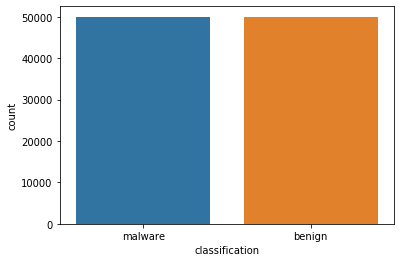

In [4]:
sns.countplot(data_all["classification"])
plt.show()

It's a balanced dataset so that's one less thing to worry about. Let's go ahead and encode the classes as 0 and 1.

In [5]:
data_all['classification'] = data_all.classification.map({'benign':0, 'malware':1})

Let's check the percentage of missing data.

In [6]:
data_all.isna().mean().round(4) * 100

hash                 11.13
millisecond           0.00
classification        0.00
state                 0.00
usage_counter        12.92
prio                  0.00
static_prio           0.00
normal_prio           0.00
policy                0.00
vm_pgoff              0.00
vm_truncate_count     0.00
task_size             0.00
cached_hole_size     24.04
free_area_cache       0.00
mm_users              0.00
map_count             0.00
hiwater_rss          24.04
total_vm              0.00
shared_vm             0.00
exec_vm               0.00
reserved_vm           0.00
nr_ptes               0.00
end_data              0.00
last_interval         0.00
nvcsw                 0.00
nivcsw                0.00
min_flt               0.00
maj_flt               0.00
fs_excl_counter       0.00
lock                  0.00
utime                 0.00
stime                 0.00
gtime                 0.00
cgtime               11.11
signal_nvcsw         11.11
dtype: float64

In [7]:
data_all.shape

(100000, 35)

Since it's a huge dataset, we will take a sample of 10,000 rows, equally from each class.

In [8]:
df1 = data_all[data_all['classification']==0]
df1 = df1.sample(n=5000, random_state=42)
df2 = data_all[data_all['classification']==1]
df2 = df2.sample(n=5000, random_state=42)

In [9]:
data = pd.concat([df1,df2])

In [10]:
data.shape

(10000, 35)

In [11]:
data.isnull().sum()

hash                 1167
millisecond             0
classification          0
state                   0
usage_counter        1340
prio                    0
static_prio             0
normal_prio             0
policy                  0
vm_pgoff                0
vm_truncate_count       0
task_size               0
cached_hole_size     2384
free_area_cache         0
mm_users                0
map_count               0
hiwater_rss          2384
total_vm                0
shared_vm               0
exec_vm                 0
reserved_vm             0
nr_ptes                 0
end_data                0
last_interval           0
nvcsw                   0
nivcsw                  0
min_flt                 0
maj_flt                 0
fs_excl_counter         0
lock                    0
utime                   0
stime                   0
gtime                   0
cgtime               1137
signal_nvcsw         1137
dtype: int64

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 40553 to 70382
Data columns (total 35 columns):
hash                 8833 non-null object
millisecond          10000 non-null int64
classification       10000 non-null int64
state                10000 non-null int64
usage_counter        8660 non-null float64
prio                 10000 non-null int64
static_prio          10000 non-null int64
normal_prio          10000 non-null int64
policy               10000 non-null int64
vm_pgoff             10000 non-null int64
vm_truncate_count    10000 non-null int64
task_size            10000 non-null int64
cached_hole_size     7616 non-null float64
free_area_cache      10000 non-null int64
mm_users             10000 non-null int64
map_count            10000 non-null int64
hiwater_rss          7616 non-null float64
total_vm             10000 non-null int64
shared_vm            10000 non-null int64
exec_vm              10000 non-null int64
reserved_vm          10000 non-null int64
nr

In [13]:
data.columns

Index(['hash', 'millisecond', 'classification', 'state', 'usage_counter',
       'prio', 'static_prio', 'normal_prio', 'policy', 'vm_pgoff',
       'vm_truncate_count', 'task_size', 'cached_hole_size', 'free_area_cache',
       'mm_users', 'map_count', 'hiwater_rss', 'total_vm', 'shared_vm',
       'exec_vm', 'reserved_vm', 'nr_ptes', 'end_data', 'last_interval',
       'nvcsw', 'nivcsw', 'min_flt', 'maj_flt', 'fs_excl_counter', 'lock',
       'utime', 'stime', 'gtime', 'cgtime', 'signal_nvcsw'],
      dtype='object')

Let's generate a profiling report from the data which will give us a good idea of variables.

In [14]:
import pandas_profiling as pp

In [15]:
pp.ProfileReport(data)

There are some variables with no values or no variations. We can remove them.

In [16]:
describe = data.describe().T

In [17]:
describe

,count,mean,std,min,25%,50%,75%,max
millisecond,10000.0,4.990326e+02,284.401531,0.000000e+00,2.510000e+02,4.960000e+02,7.450000e+02,9.990000e+02
classification,10000.0,5.000000e-01,0.500025,0.000000e+00,0.000000e+00,5.000000e-01,1.000000e+00,1.000000e+00
state,10000.0,1.513779e+05,900670.072979,0.000000e+00,0.000000e+00,0.000000e+00,4.096000e+03,4.326605e+07
usage_counter,8660.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
prio,10000.0,3.069708e+09,294424.719549,3.069190e+09,3.069452e+09,3.069702e+09,3.069960e+09,3.070222e+09
static_prio,10000.0,1.820886e+04,4660.561490,1.398800e+04,1.435200e+04,1.615900e+04,2.218200e+04,3.185500e+04
normal_prio,10000.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
policy,10000.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
vm_pgoff,10000.0,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
vm_truncate_count,10000.0,1.532304e+04,3257.803904,9.695000e+03,1.264800e+04,1.534500e+04,1.766900e+04,2.708900e+04


In [18]:
non_zero_varibales = describe[describe['std']>0].index

Dropping variables with zero standard deviation(no variance).

In [19]:
data = data[non_zero_varibales]
data_all = data_all[non_zero_varibales]

In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 40553 to 70382
Data columns (total 23 columns):
millisecond          10000 non-null int64
classification       10000 non-null int64
state                10000 non-null int64
prio                 10000 non-null int64
static_prio          10000 non-null int64
vm_truncate_count    10000 non-null int64
free_area_cache      10000 non-null int64
mm_users             10000 non-null int64
map_count            10000 non-null int64
total_vm             10000 non-null int64
shared_vm            10000 non-null int64
exec_vm              10000 non-null int64
reserved_vm          10000 non-null int64
end_data             10000 non-null int64
last_interval        10000 non-null int64
nvcsw                10000 non-null int64
nivcsw               10000 non-null int64
min_flt              10000 non-null int64
maj_flt              10000 non-null int64
fs_excl_counter      10000 non-null int64
utime                10000 non-null int64
stime

In [21]:
describe = data.describe().T

In [22]:
low_range = describe[(describe['mean']<100) & (describe['std']<5)].index
low_range_1 = describe[(describe['mean']<100) & (describe['std']>5)].index
high_range = describe[describe['mean']>100].index

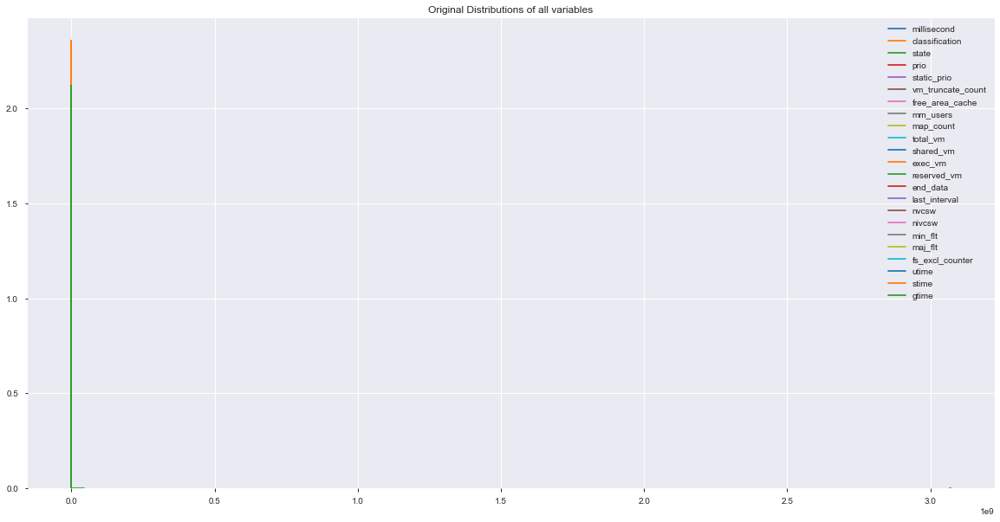

In [23]:
# plot original distribution plot
fig, (ax1) = plt.subplots(ncols=1, figsize=(20, 10))
ax1.set_title('Original Distributions of all variables')

for var in non_zero_varibales:
    sns.kdeplot(data[var], ax=ax1);

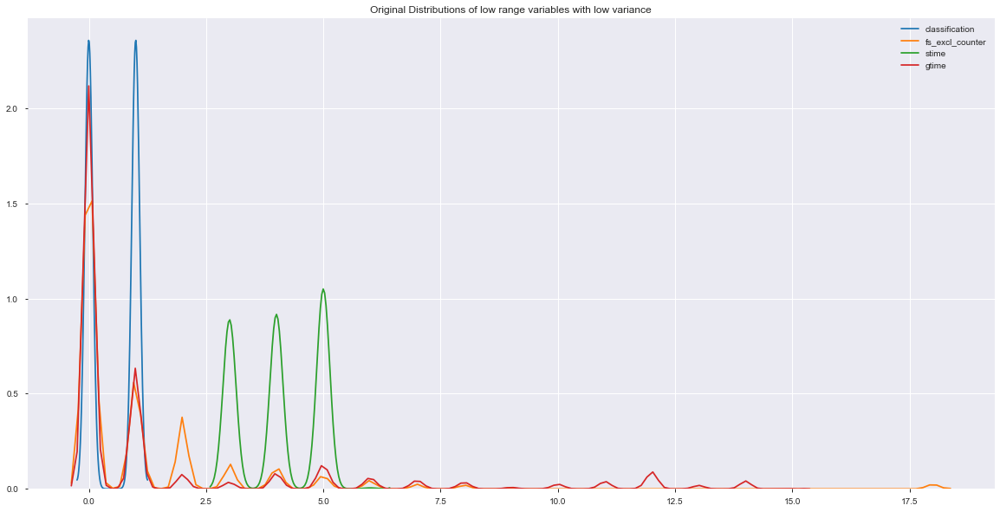

In [24]:
# plot original distribution plot
fig, (ax1) = plt.subplots(ncols=1, figsize=(20, 10))
ax1.set_title('Original Distributions of low range variables with low variance')

for var in low_range:
    sns.kdeplot(data[var], ax=ax1);

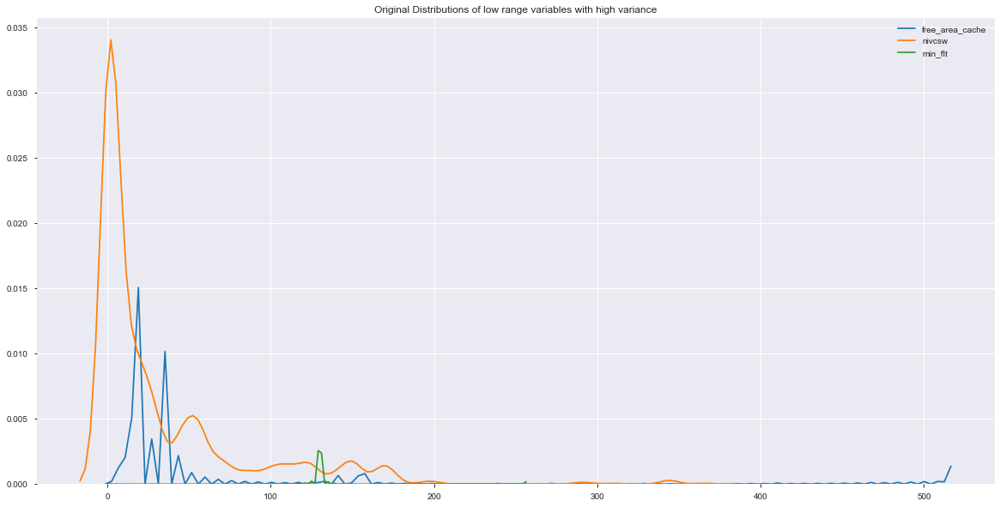

In [25]:
# plot original distribution plot
fig, (ax1) = plt.subplots(ncols=1, figsize=(20, 10))
ax1.set_title('Original Distributions of low range variables with high variance')

for var in low_range_1:
    sns.kdeplot(data[var], ax=ax1);

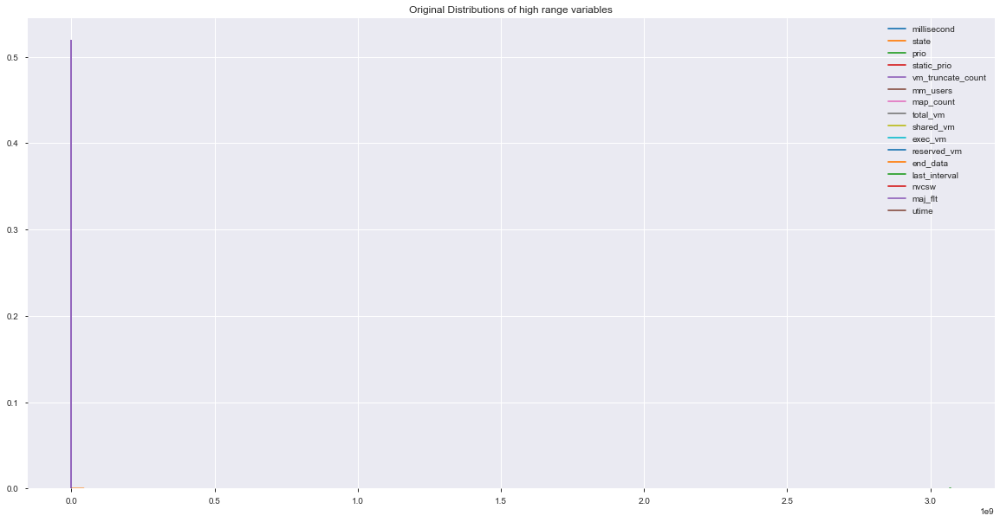

In [26]:
# plot original distribution plot
fig, (ax1) = plt.subplots(ncols=1, figsize=(20, 10))
ax1.set_title('Original Distributions of high range variables')

for var in high_range:
    sns.kdeplot(data[var], ax=ax1);

Let's check the correlation amongst variables.

In [27]:
corr=data.corr()
corr.nlargest(35,'classification')["classification"]

classification       1.000000e+00
prio                 1.130953e-01
last_interval        2.921394e-02
min_flt              1.575879e-02
millisecond          3.198085e-19
gtime               -1.518056e-02
stime               -3.367050e-02
free_area_cache     -3.709443e-02
state               -6.408656e-02
total_vm            -7.405280e-02
mm_users            -9.372898e-02
reserved_vm         -1.219452e-01
fs_excl_counter     -1.386238e-01
nivcsw              -1.470920e-01
exec_vm             -2.577259e-01
map_count           -2.834297e-01
end_data            -3.120437e-01
maj_flt             -3.120437e-01
shared_vm           -3.120437e-01
static_prio         -3.326473e-01
vm_truncate_count   -3.575935e-01
utime               -3.692862e-01
nvcsw               -3.897392e-01
Name: classification, dtype: float64

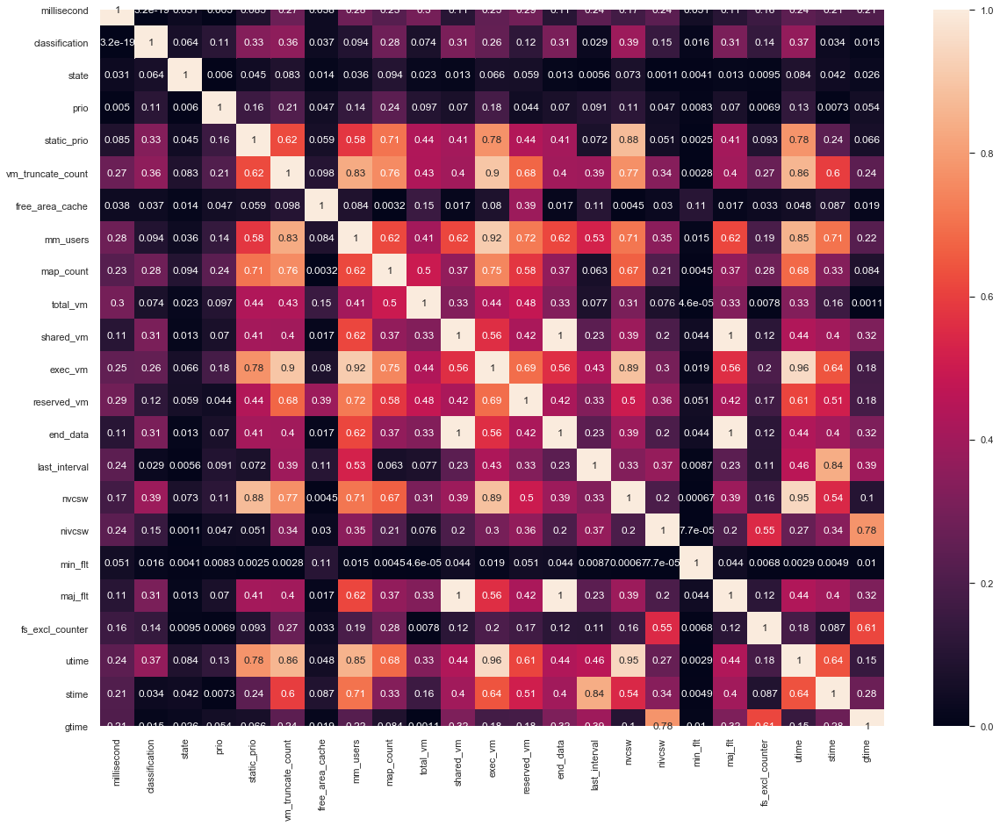

In [28]:
sns.set(rc={'figure.figsize':(20,15)})
sns.heatmap(data.corr().abs(),annot=True)

In [29]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

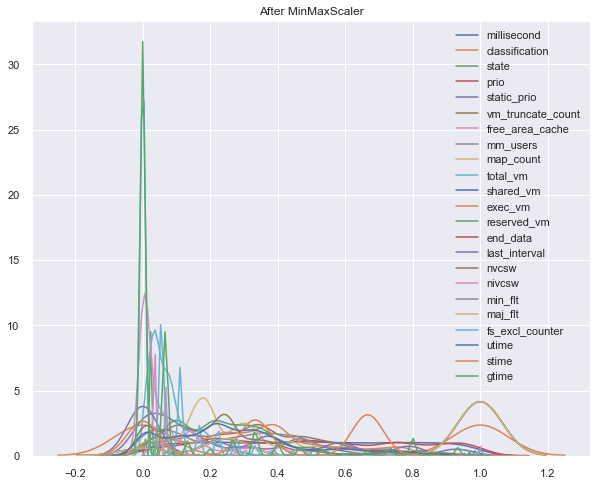

In [30]:
mm_scaler = MinMaxScaler()
df_mm = mm_scaler.fit_transform(data)

df_mm = pd.DataFrame(df_mm, columns=non_zero_varibales)

fig, (ax1) = plt.subplots(ncols=1, figsize=(10, 8))
ax1.set_title('After MinMaxScaler')
for var in non_zero_varibales:
    sns.kdeplot(df_mm[var], ax=ax1);

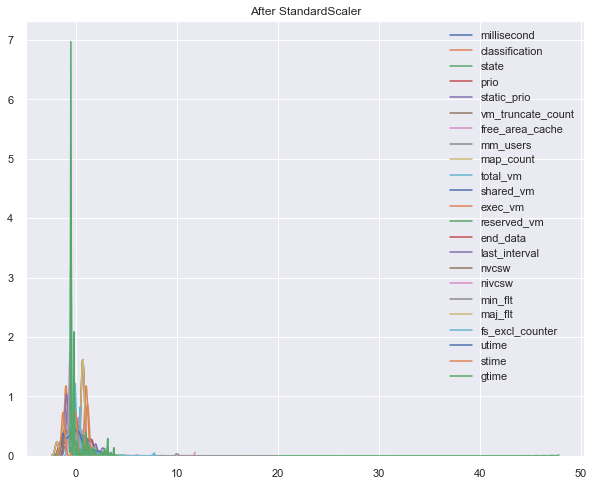

In [31]:
s_scaler = StandardScaler()
df_s = s_scaler.fit_transform(data)

df_s = pd.DataFrame(df_s, columns=non_zero_varibales)

fig, (ax1) = plt.subplots(ncols=1, figsize=(10, 8))
ax1.set_title('After StandardScaler')

for var in non_zero_varibales:
    sns.kdeplot(df_s[var], ax=ax1);

In [32]:
df_s_desc = df_s.describe().T

In [33]:
less = df_s_desc[df_s_desc['max']<4].index

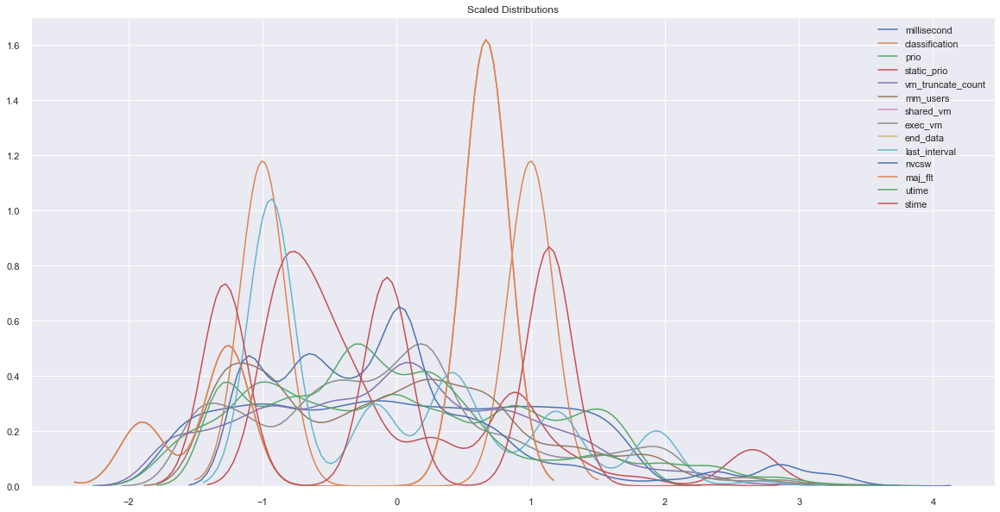

In [34]:
# plot original distribution plot
fig, (ax1) = plt.subplots(ncols=1, figsize=(20, 10))
ax1.set_title('Scaled Distributions')

for var in less:
    sns.kdeplot(df_s[var], ax=ax1);

So we finally decide on using MinMax scalar as it preserves the original shape of distributions and is able to scale better without producing outliers.

Let's now seperate our X and y variables.

In [35]:
X = data.drop('classification', axis=1)
y = data['classification']

We will split the data in train and test using 80:20 split. Also apply scaling.

In [36]:
X_train_org, X_test_org, y_train, y_test = train_test_split(X, y, random_state = 0, test_size = 0.2)

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train_org)
X_test = scaler.transform(X_test_org)

In [37]:
X_all = data_all.drop('classification', axis=1)
y_all = data_all['classification']
scaler = MinMaxScaler()
X_all = scaler.fit_transform(X_all)

In [38]:
y_train_mat = y_train.as_matrix()

In [39]:
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.model_selection import cross_val_score

#### Applying voting classifiers with hard voting

In [40]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

log_clf = LogisticRegression()
log_clf.fit(X_train, y_train)
knn_clf = KNeighborsClassifier(7)
knn_clf.fit(X_train, y_train)
svm_clf = SVC(C = 10, probability = True)
svm_clf.fit(X_train, y_train)

voting_clf1 = VotingClassifier(estimators=[('lr', log_clf), ('knn', knn_clf), ('svc', svm_clf)], voting='hard')
voting_clf1.fit(X_train, y_train)

from sklearn.metrics import accuracy_score
for clf in (log_clf, knn_clf, svm_clf, voting_clf1):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(clf.__class__.__name__, accuracy_score(y_test, y_pred))

LogisticRegression 0.915
KNeighborsClassifier 0.999
SVC 0.963
VotingClassifier 0.9645


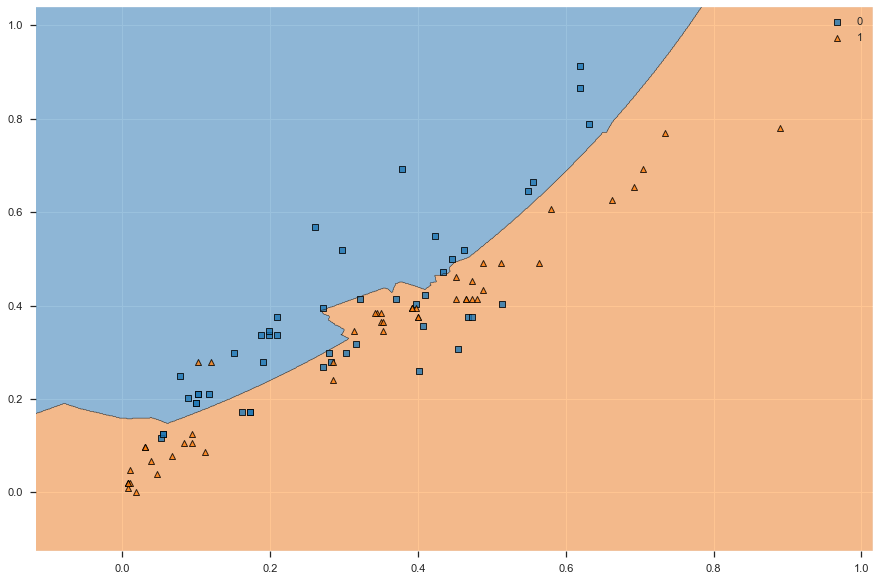

In [41]:
%matplotlib inline
from mlxtend.plotting import plot_decision_regions

X_b = X_train[500:600, [6,10]]
y_b = y_train_mat[500:600]

voting_clf1.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = voting_clf1, zoom_factor=8)
plt.show()

#### Applying voting classifiers with soft voting

In [42]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

log_clf = LogisticRegression()
log_clf.fit(X_train, y_train)
knn_clf = KNeighborsClassifier(7)
knn_clf.fit(X_train, y_train)
svm_clf = SVC(C = 10, probability = True)
svm_clf.fit(X_train, y_train)

voting_clf = VotingClassifier(estimators=[('lr', log_clf), ('knn', knn_clf), ('svc', svm_clf)], voting='soft')
voting_clf.fit(X_train, y_train)

from sklearn.metrics import accuracy_score
for clf in (log_clf, knn_clf, svm_clf, voting_clf):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(clf.__class__.__name__, accuracy_score(y_test, y_pred))


LogisticRegression 0.915
KNeighborsClassifier 0.999
SVC 0.963
VotingClassifier 0.9795


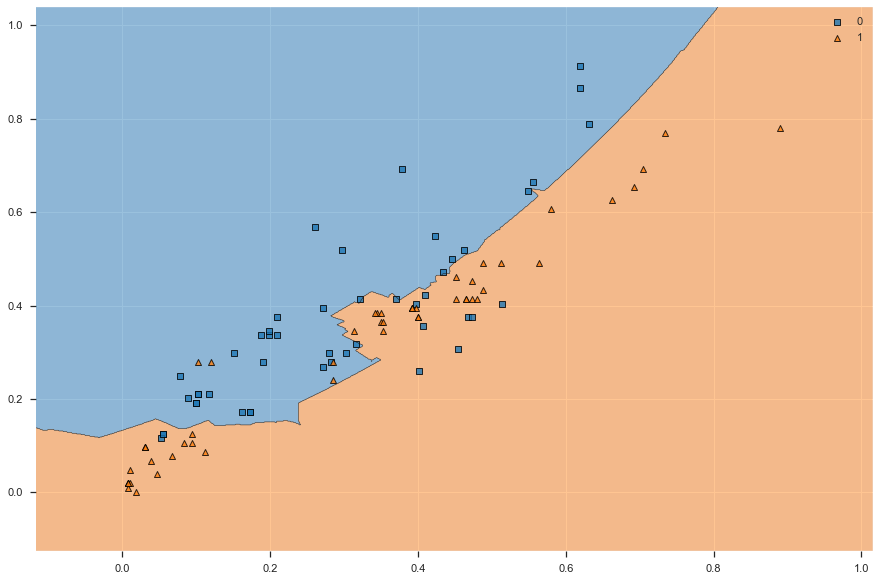

In [43]:
%matplotlib inline
from mlxtend.plotting import plot_decision_regions

X_b = X_train[500:600, [6,10]]
y_b = y_train_mat[500:600]

voting_clf.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = voting_clf, zoom_factor=8)
plt.show()

We find that soft voting is performing better for our case.

#### Bagging models

In [44]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

dt_clf = DecisionTreeClassifier(random_state=0)
bag_clf = BaggingClassifier(dt_clf, n_estimators=500, max_samples=100, bootstrap=True, n_jobs=-1, random_state=0)

bag_clf.fit(X_train, y_train)
y_pred = bag_clf.predict(X_test)
bag_clf.fit(X_train, y_train)
print('Train score: {:.2f}'.format(bag_clf.score(X_train, y_train)))
print('Test score: {:.2f}'.format(bag_clf.score(X_test, y_test)))

Train score: 0.97
Test score: 0.97


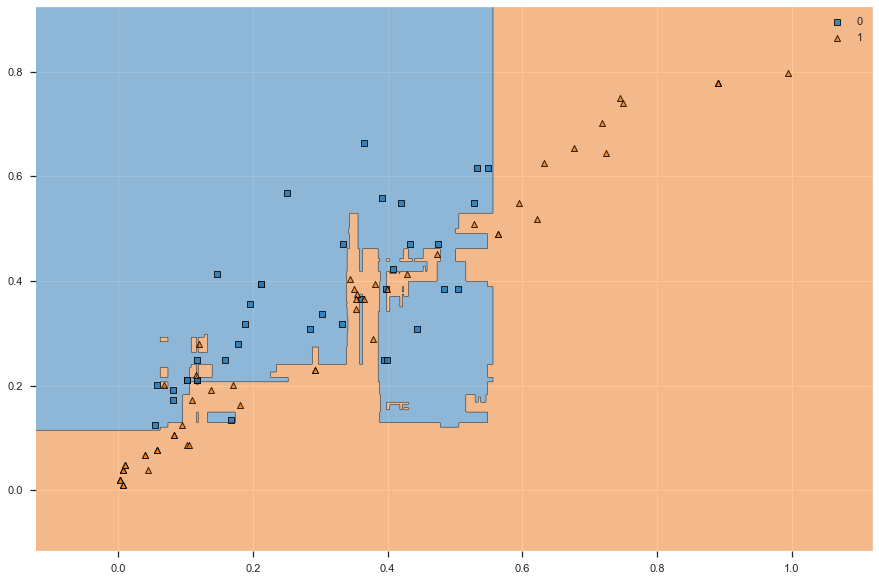

In [45]:
%matplotlib inline
from mlxtend.plotting import plot_decision_regions

X_b = X_train[1500:1600, [6,10]]
y_b = y_train_mat[1500:1600]

bag_clf.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = bag_clf, zoom_factor=8)
plt.show()

In [46]:
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier

knn_clf = KNeighborsClassifier(n_neighbors = 3)
bag_clf = BaggingClassifier(knn_clf, n_estimators=500, max_samples=100, bootstrap=True, n_jobs=-1, random_state=0)

bag_clf.fit(X_train, y_train)
y_pred = bag_clf.predict(X_test)
bag_clf.fit(X_train, y_train)
print('Train score: {:.2f}'.format(bag_clf.score(X_train, y_train)))
print('Test score: {:.2f}'.format(bag_clf.score(X_test, y_test)))

Train score: 0.90
Test score: 0.89


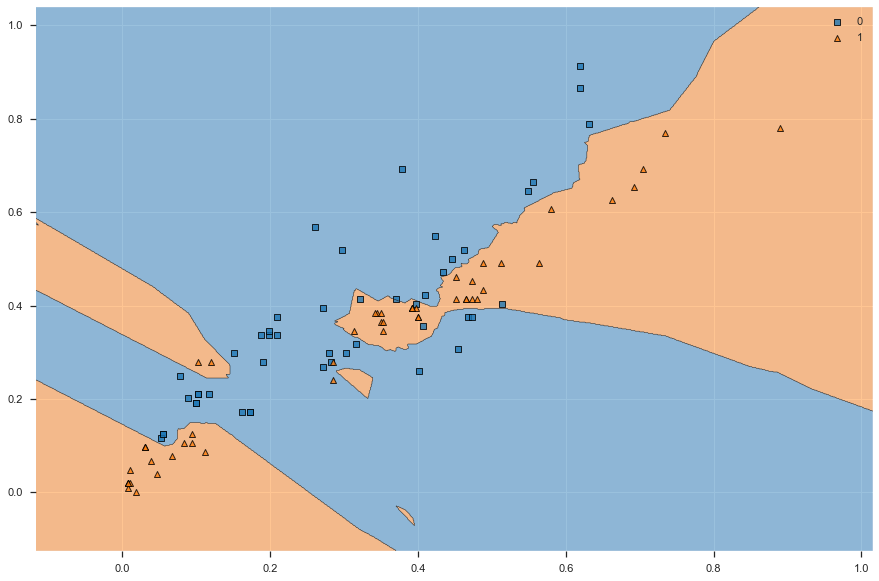

In [47]:
%matplotlib inline
from mlxtend.plotting import plot_decision_regions

X_b = X_train[500:600, [6,10]]
y_b = y_train_mat[500:600]

bag_clf.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = bag_clf, zoom_factor=8)
plt.show()

#### Pasting models

In [48]:
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import LinearSVC

clf = LinearSVC()
bag_clf = BaggingClassifier(clf, n_estimators=500, max_samples=100, bootstrap=False, n_jobs=-1, random_state=0)

bag_clf.fit(X_train, y_train)
y_pred = bag_clf.predict(X_test)
bag_clf.fit(X_train, y_train)
print('Train score: {:.2f}'.format(bag_clf.score(X_train, y_train)))
print('Test score: {:.2f}'.format(bag_clf.score(X_test, y_test)))

Train score: 0.93
Test score: 0.93


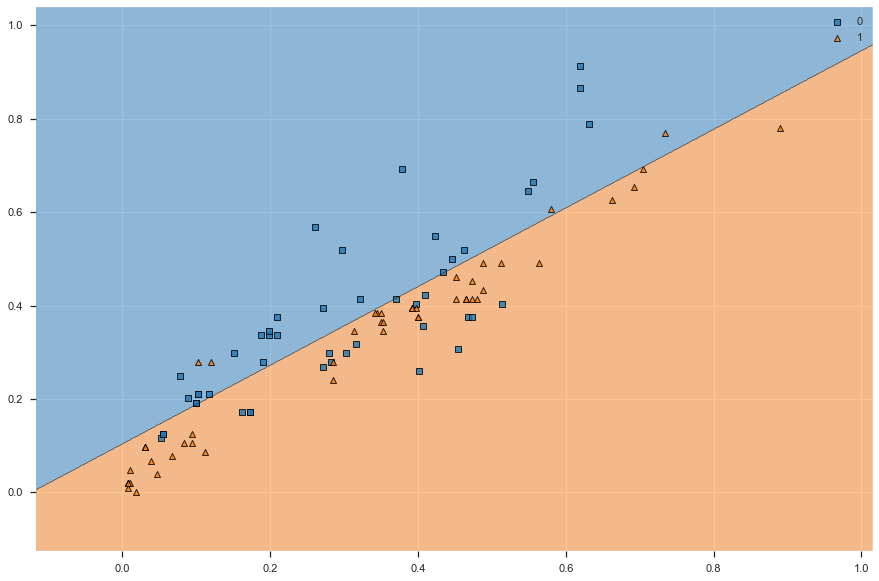

In [49]:
%matplotlib inline
from mlxtend.plotting import plot_decision_regions

X_b = X_train[500:600, [6,10]]
y_b = y_train_mat[500:600]

bag_clf.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = bag_clf, zoom_factor=8)
plt.show()

In [50]:
from sklearn.ensemble import BaggingClassifier
from sklearn import svm

clf = svm.SVC(kernel='rbf')
bag_clf = BaggingClassifier(clf, n_estimators=500, max_samples=100, bootstrap=False, n_jobs=-1, random_state=0)

bag_clf.fit(X_train, y_train)
y_pred = bag_clf.predict(X_test)
bag_clf.fit(X_train, y_train)
print('Train score: {:.2f}'.format(bag_clf.score(X_train, y_train)))
print('Test score: {:.2f}'.format(bag_clf.score(X_test, y_test)))

Train score: 0.80
Test score: 0.80


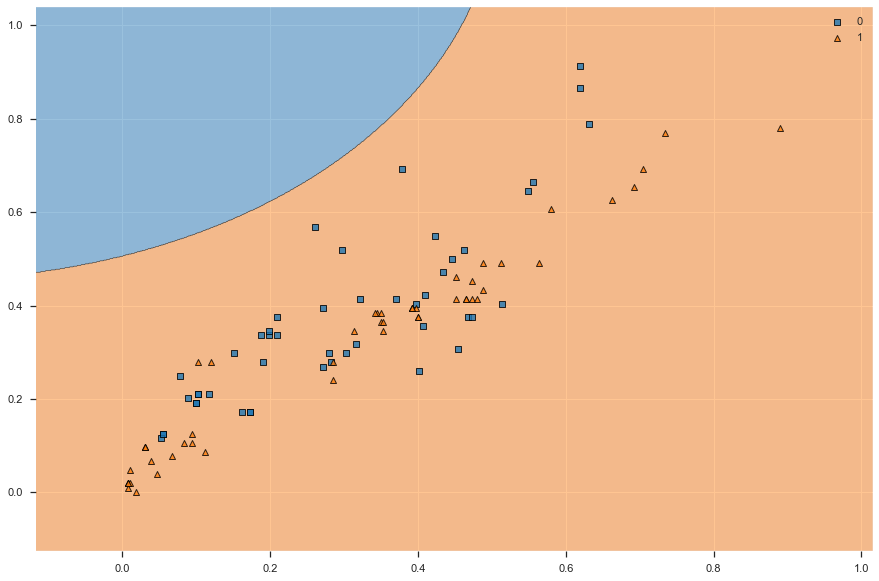

In [51]:
%matplotlib inline
from mlxtend.plotting import plot_decision_regions

X_b = X_train[500:600, [6,10]]
y_b = y_train_mat[500:600]

bag_clf.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = bag_clf, zoom_factor=8)
plt.show()

#### AdaBossting

In [52]:
from sklearn.ensemble import AdaBoostClassifier
ada_clf = AdaBoostClassifier(DecisionTreeClassifier(max_depth=1), n_estimators=200, algorithm="SAMME.R", learning_rate=0.5, random_state=0)
ada_clf.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=DecisionTreeClassifier(class_weight=None,
                                                         criterion='gini',
                                                         max_depth=1,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                                         min_weight_fraction_leaf=0.0,
                                                         presort=False,
                                                         random_state=None,
                             

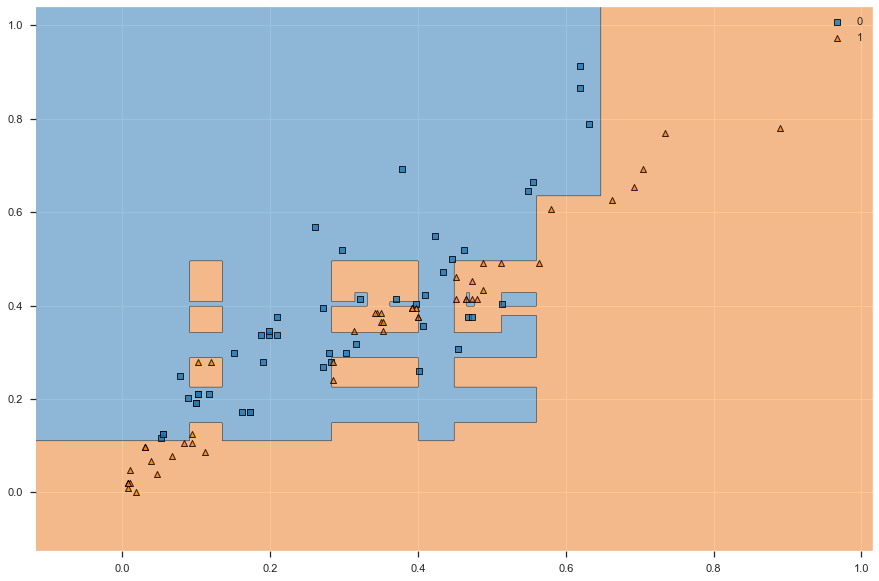

In [53]:
%matplotlib inline
from mlxtend.plotting import plot_decision_regions

X_b = X_train[500:600, [6,10]]
y_b = y_train_mat[500:600]

ada_clf.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = ada_clf, zoom_factor=8)
plt.show()

In [54]:
ada_clf = AdaBoostClassifier(svm.SVC(kernel='rbf'), n_estimators=200, algorithm="SAMME", learning_rate=0.5, random_state=0)
ada_clf.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME',
                   base_estimator=SVC(C=1.0, cache_size=200, class_weight=None,
                                      coef0=0.0, decision_function_shape='ovr',
                                      degree=3, gamma='auto_deprecated',
                                      kernel='rbf', max_iter=-1,
                                      probability=False, random_state=None,
                                      shrinking=True, tol=0.001,
                                      verbose=False),
                   learning_rate=0.5, n_estimators=200, random_state=0)

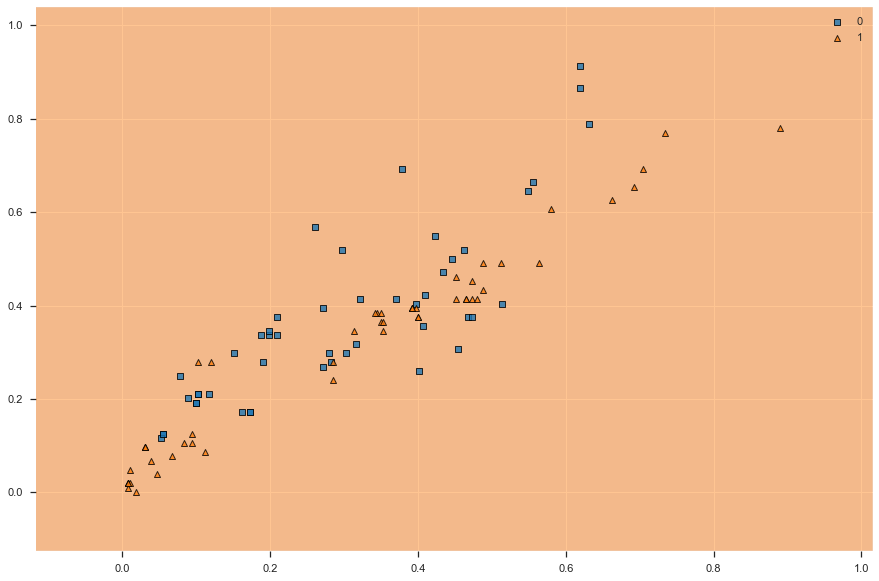

In [55]:
%matplotlib inline
from mlxtend.plotting import plot_decision_regions

X_b = X_train[500:600, [6,10]]
y_b = y_train_mat[500:600]

ada_clf.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = ada_clf, zoom_factor=8)
plt.show()

#### Gradient Boosting

In [56]:
from sklearn.ensemble import GradientBoostingClassifier

gbrt = GradientBoostingClassifier(random_state=0)
gbrt.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 1.000


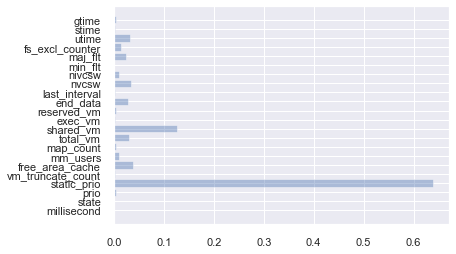

In [57]:
%matplotlib inline

y_list = gbrt.feature_importances_
y_pos = np.arange(len(y_list))
features = X.columns
plt.barh(y_pos, y_list, align='center', alpha=0.4)
plt.yticks(y_pos, features)
plt.show()

#### Applying PCA

In [58]:
from sklearn.decomposition import PCA
pca = PCA(n_components=0.95)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)
X_all = pca.transform(X_all)

In [59]:
models = ['KNN Classifier','Logistic Regression','Linear SVM Classifier','SVM with Linear Kernel','SVM with rbf Kernel','SVM with Polynomial Kernel','Decision Tree Classifier']
model_performance = pd.DataFrame(columns=['Test Accuracy','Generalize Accuracy','Average CV Score','Best Parameters'], index=models)

### KNN Classifier with PCA
We will use KNN Classifier with Grid Search and Cross validation to find the best parameters for our model.

In [60]:
from sklearn.neighbors import KNeighborsClassifier

#making the instance
model = KNeighborsClassifier(n_jobs=-1)
#Hyper Parameters Set
params = {'n_neighbors':[1,2,3,4,5],
          'leaf_size':[1,2,3,5],
          'weights':['uniform', 'distance'],
          'algorithm':['auto', 'ball_tree','kd_tree','brute'],
          'n_jobs':[-1]}
# Create grid search using 5-fold cross validation
model1 = GridSearchCV(model, param_grid=params, n_jobs=-1, cv=5)
#Learning
model1.fit(X_train,y_train)
#The best hyper parameters set
print("Best Hyper Parameters:\n",model1.best_params_)
#Prediction
prediction=model1.predict(X_test)
#evaluation(Accuracy)
testscore = metrics.accuracy_score(prediction,y_test)
print("Test Accuracy:",testscore)
#evaluation(Confusion Metrix)
print("Test Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))

#Prediction for Generalization
prediction=model1.predict(X_all)
#evaluation(Accuracy)
genscore = metrics.accuracy_score(prediction,y_all)
print("Generalize Accuracy:",genscore)
#evaluation(Confusion Metrix)
print("Generalize Confusion Matrix:\n",metrics.confusion_matrix(prediction,y_all))
#cross validation score
scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-validation scores: {}".format(scores))
print("Average cross-validation score: {:.2f}".format(scores.mean()))

model_performance.loc['KNN Classifier'] = pd.Series({'Test Accuracy':testscore,'Generalize Accuracy':genscore,'Average CV Score':scores.mean(),'Best Parameters':model1.best_params_})

Best Hyper Parameters:
 {'algorithm': 'auto', 'leaf_size': 1, 'n_jobs': -1, 'n_neighbors': 1, 'weights': 'uniform'}
Test Accuracy: 1.0
Test Confusion Metrix:
 [[ 988    0]
 [   0 1012]]
Generalize Accuracy: 0.99972
Generalize Confusion Matrix:
 [[49980     8]
 [   20 49992]]
Cross-validation scores: [0.99937539 0.99687695 0.998125   0.99687305 0.99812383]
Average cross-validation score: 1.00


Let's plot the decision boundries for 100 data points to get an idea of model classified boundries, we can only plot for 2 features at a time.

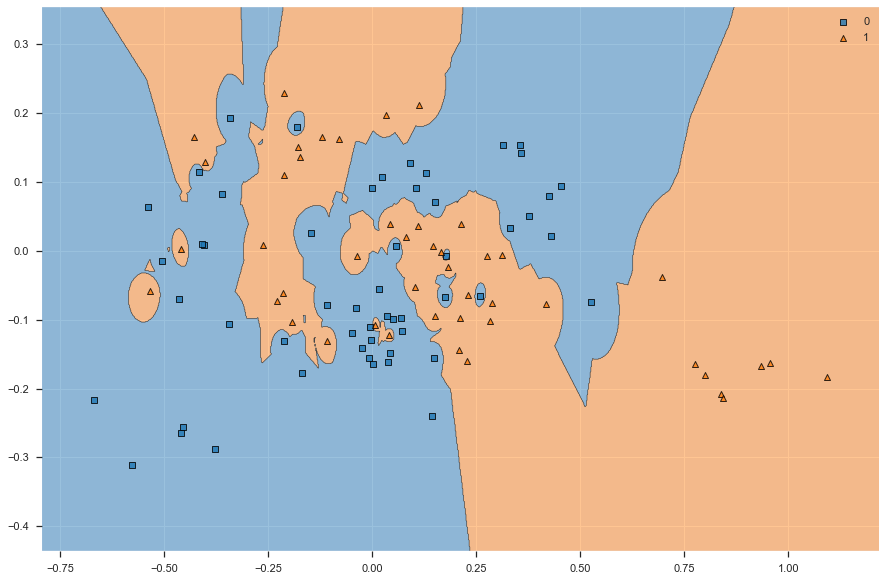

In [61]:
from mlxtend.plotting import plot_decision_regions

X_b = X_train[200:300,[2,6]]
y_b = y_train_mat[200:300]

knn = KNeighborsClassifier(algorithm= 'auto', leaf_size= 1, n_neighbors= 3, weights= 'distance')
knn.fit(X_b, y_b)
fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = knn, zoom_factor=8)
plt.show()

### Logistic Regression with PCA
We will use Logistic Regression with Grid Search and Cross validation to find the best parameters for our model.

In [62]:
from sklearn.linear_model import LogisticRegression

# Create logistic regression
logistic = LogisticRegression()
# Create regularization penalty space
penalty = ['l1', 'l2']

# Create regularization hyperparameter space
C = np.logspace(0, 4, 10)

# Create hyperparameter options
hyperparameters = dict(C=C, penalty=penalty)
# Create grid search using 5-fold cross validation
model2 = GridSearchCV(logistic, hyperparameters, cv=5, verbose=0, n_jobs=-1)
# Fit grid search
best_model = model2.fit(X_train, y_train)
# View best hyperparameters
print('Best Penalty:', best_model.best_estimator_.get_params()['penalty'])
print('Best C:', best_model.best_estimator_.get_params()['C'])
#Prediction
prediction=model2.predict(X_test)
#evaluation(Accuracy)
testscore = metrics.accuracy_score(prediction,y_test)
print("Accuracy:",testscore)
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))

#Prediction for Generalization
prediction=model2.predict(X_all)
#evaluation(Accuracy)
genscore = metrics.accuracy_score(prediction,y_all)
print("Generalize Accuracy:",genscore)
#evaluation(Confusion Metrix)
print("Generalize Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_all))

model_performance.loc['Logistic Regression'] = pd.Series({'Test Accuracy':testscore,'Generalize Accuracy':genscore,'Average CV Score':scores.mean(),'Best Parameters':model2.best_params_})

Best Penalty: l1
Best C: 59.94842503189409
Accuracy: 0.8745
Confusion Metrix:
 [[846 109]
 [142 903]]
Generalize Accuracy: 0.88045
Generalize Confusion Metrix:
 [[43725  5680]
 [ 6275 44320]]


Let's plot the decision boundries for 100 data points to get an idea of model classified boundries, we can only plot for 2 features at a time.

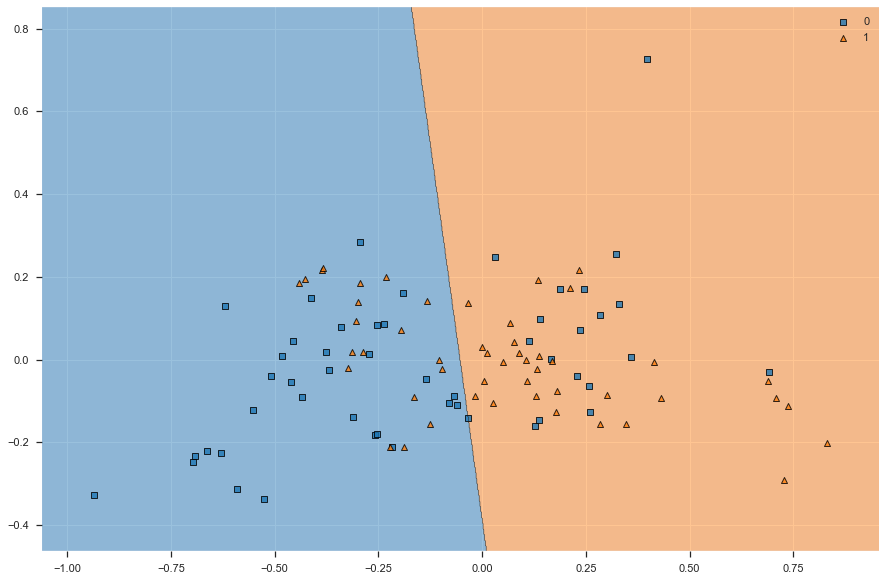

In [63]:
%matplotlib inline

from mlxtend.plotting import plot_decision_regions

X_b = X_train[2000:2100, [2,6]]
y_b = y_train_mat[2000:2100]

lreg = LogisticRegression()
lreg.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = lreg, zoom_factor=8)

plt.show()

### Linear SVM Classifier with PCA
We will use Linear SVM Classifier with Grid Search and Cross validation to find the best parameters for our model.

In [64]:
from sklearn.svm import LinearSVC

# Create Linear SVC
linearsvc = LinearSVC()

# Create regularization hyperparameter space
C = np.logspace(0, 4, 10)

# Create hyperparameter options
hyperparameters = dict(C=C)
# Create grid search using 5-fold cross validation
model3 = GridSearchCV(linearsvc, hyperparameters, cv=5, verbose=0, n_jobs=-1)
# Fit grid search
best_model = model3.fit(X_train, y_train)
# View best hyperparameters
print('Best Penalty:', best_model.best_estimator_.get_params()['penalty'])
print('Best C:', best_model.best_estimator_.get_params()['C'])
#Prediction
prediction=model3.predict(X_test)
#evaluation(Accuracy)
testscore = metrics.accuracy_score(prediction,y_test)
print("Accuracy:",testscore)
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))

#Prediction for Generalization
prediction=model3.predict(X_all)
#evaluation(Accuracy)
genscore = metrics.accuracy_score(prediction,y_all)
print("Generalize Accuracy:",genscore)
#evaluation(Confusion Metrix)
print("Generalize Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_all))

model_performance.loc['Linear SVM Classifier'] = pd.Series({'Test Accuracy':testscore,'Generalize Accuracy':genscore,'Average CV Score':scores.mean(),'Best Parameters':model3.best_params_})

Best Penalty: l2
Best C: 2.7825594022071245
Accuracy: 0.867
Confusion Metrix:
 [[835 113]
 [153 899]]
Generalize Accuracy: 0.87344
Generalize Confusion Metrix:
 [[42942  5598]
 [ 7058 44402]]


Let's plot the decision boundries for 100 data points to get an idea of model classified boundries, we can only plot for 2 features at a time.

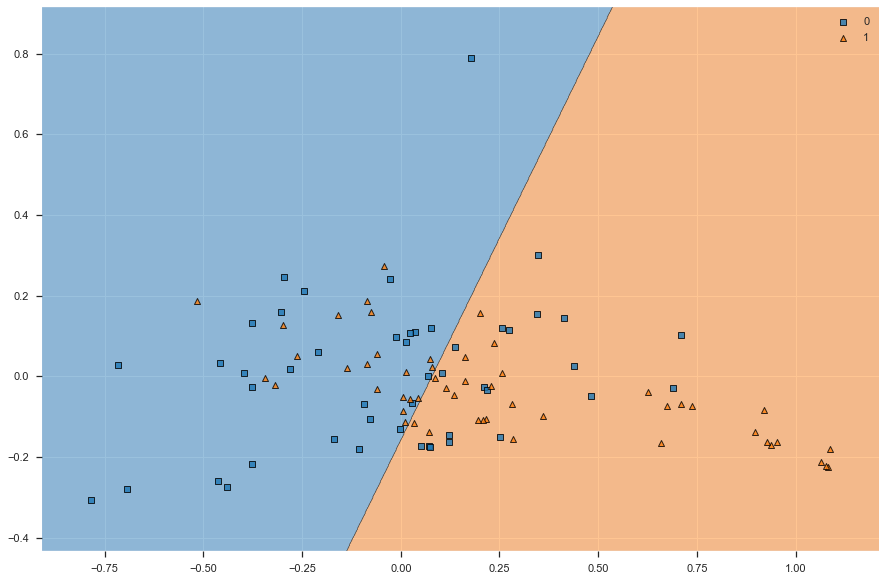

In [65]:
%matplotlib inline
figsize=(20, 10)
from mlxtend.plotting import plot_decision_regions

X_b = X_train[500:600, [2,6]]
y_b = y_train_mat[500:600]

linearsvc = LinearSVC()
linearsvc.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = linearsvc, zoom_factor=8)
plt.show()

### SVM with Linear Kernel with PCA
We will use Support Vector Machine with Linear Kernel with Grid Search and Cross validation to find the best parameters for our model.

In [66]:
from sklearn import svm
#making the instance
model=svm.SVC(kernel='linear')

#Hyper Parameters Set
params = {'C': [1, 10, 100, 1000],
          'gamma': [0.01, 0.1, 1, 10]}
#Making models with hyper parameters sets
model4 = GridSearchCV(model, param_grid=params, n_jobs=-1, cv=5)
#Learning
model4.fit(X_train,y_train)
#The best hyper parameters set
print("Best Hyper Parameters:\n",model4.best_params_)
#Prediction
prediction=model4.predict(X_test)
#importing the metrics module
from sklearn import metrics
#evaluation(Accuracy)
testscore = metrics.accuracy_score(prediction,y_test)
print("Accuracy:",testscore)
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))

#Prediction for Generalization
prediction=model4.predict(X_all)
#evaluation(Accuracy)
genscore = metrics.accuracy_score(prediction,y_all)
print("Generalize Accuracy:",genscore)
#evaluation(Confusion Metrix)
print("Generalize Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_all))

model_performance.loc['SVM with Linear Kernel'] = pd.Series({'Test Accuracy':testscore,'Generalize Accuracy':genscore,'Average CV Score':scores.mean(),'Best Parameters':model4.best_params_})

Best Hyper Parameters:
 {'C': 1000, 'gamma': 0.01}
Accuracy: 0.883
Confusion Metrix:
 [[854 100]
 [134 912]]
Generalize Accuracy: 0.88773
Generalize Confusion Metrix:
 [[44428  5655]
 [ 5572 44345]]


Let's plot the decision boundries for 100 data points to get an idea of model classified boundries, we can only plot for 2 features at a time.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


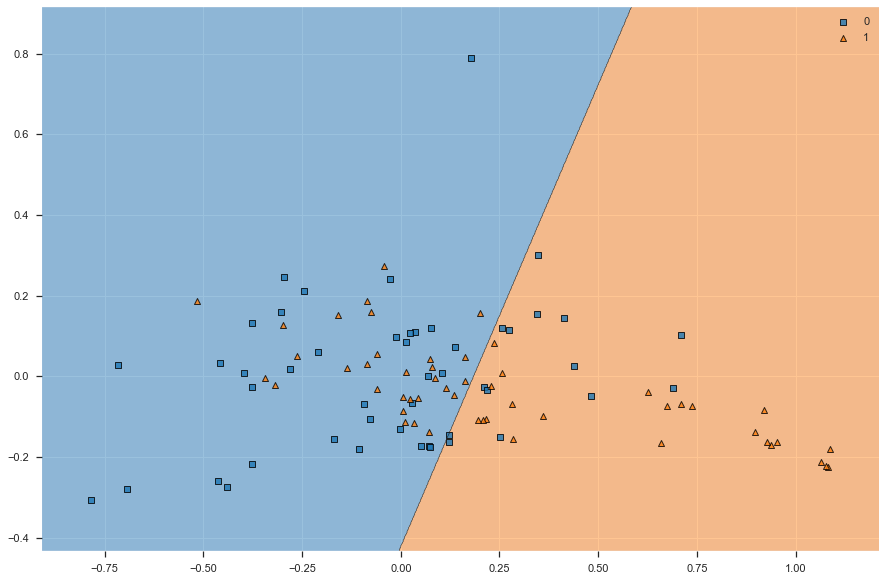

In [67]:
%matplotlib inline
from mlxtend.plotting import plot_decision_regions

X_b = X_train[500:600, [2,6]]
y_b = y_train_mat[500:600]

model4.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = model4, zoom_factor=8)
plt.show()

### SVM with rbf Kernel with PCA
We will use Support Vector Machine with rbf Kernel with Grid Search and Cross validation to find the best parameters for our model.

In [68]:
from sklearn import svm
#making the instance
model=svm.SVC(kernel='rbf')

#Hyper Parameters Set
params = {'C': np.logspace(0, 4, 10),
          'gamma': [0.01, 0.1, 1, 10]}
#Making models with hyper parameters sets
model5 = GridSearchCV(model, param_grid=params, n_jobs=-1, cv=5)
#Learning
model5.fit(X_train,y_train)
#The best hyper parameters set
print("Best Hyper Parameters:\n",model5.best_params_)
#Prediction
prediction=model5.predict(X_test)
#importing the metrics module
from sklearn import metrics
#evaluation(Accuracy)
testscore = metrics.accuracy_score(prediction,y_test)
print("Accuracy:",testscore)
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))

#Prediction for Generalization
prediction=model5.predict(X_all)
#evaluation(Accuracy)
genscore = metrics.accuracy_score(prediction,y_all)
print("Generalize Accuracy:",genscore)
#evaluation(Confusion Metrix)
print("Generalize Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_all))

model_performance.loc['SVM with rbf Kernel'] = pd.Series({'Test Accuracy':testscore,'Generalize Accuracy':genscore,'Average CV Score':scores.mean(),'Best Parameters':model5.best_params_})

Best Hyper Parameters:
 {'C': 10000.0, 'gamma': 1}
Accuracy: 0.999
Confusion Metrix:
 [[ 986    0]
 [   2 1012]]
Generalize Accuracy: 0.97775
Generalize Confusion Metrix:
 [[49831  2056]
 [  169 47944]]


Let's plot the decision boundries for 100 data points to get an idea of model classified boundries, we can only plot for 2 features at a time.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


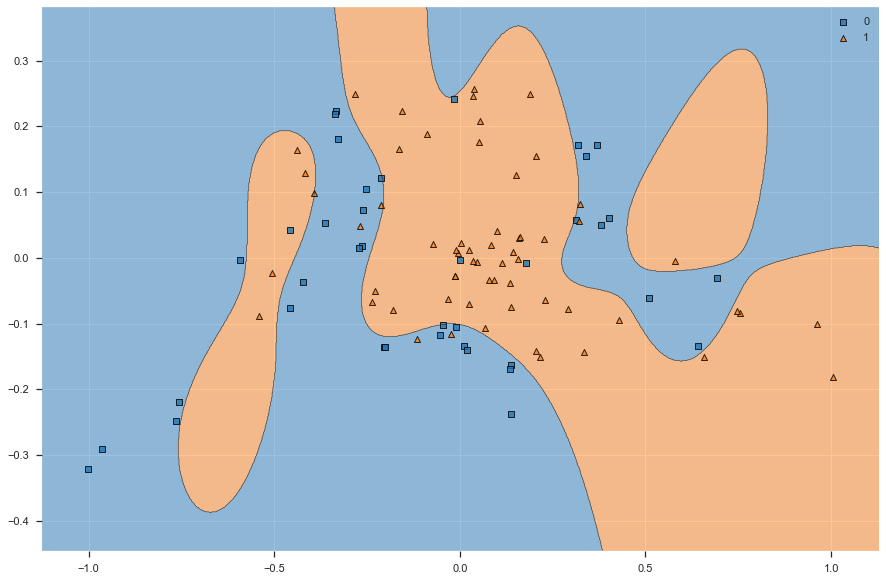

In [69]:
%matplotlib inline
from mlxtend.plotting import plot_decision_regions

X_b = X_train[1500:1600, [2,6]]
y_b = y_train_mat[1500:1600]

model5.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = model5, zoom_factor=8)
plt.show()

### SVM with Polynomial Kernel with PCA
We will use Support Vector Machine with Polynomial Kernel with Grid Search and Cross validation to find the best parameters for our model.

In [78]:
from sklearn import svm
#making the instance
model=svm.SVC(kernel='poly')

#Hyper Parameters Set
params = {'C': [1, 10],
          'gamma': [0.1, 1],
          'degree': [2,3]}
#Making models with hyper parameters sets
model6 = GridSearchCV(model, param_grid=params, n_jobs=-1, cv=5)
#Learning
model6.fit(X_train,y_train)
#The best hyper parameters set
print("Best Hyper Parameters:\n",model6.best_params_)
#Prediction
prediction=model6.predict(X_test)

#evaluation(Accuracy)
testscore = metrics.accuracy_score(prediction,y_test)
print("Accuracy:",testscore)
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))

#Prediction for Generalization
prediction=model6.predict(X_all)
#evaluation(Accuracy)
genscore = metrics.accuracy_score(prediction,y_all)
print("Generalize Accuracy:",genscore)
#evaluation(Confusion Metrix)
print("Generalize Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_all))

model_performance.loc['SVM with Polynomial Kernel'] = pd.Series({'Test Accuracy':testscore,'Generalize Accuracy':genscore,'Average CV Score':scores.mean(),'Best Parameters':model6.best_params_})

Best Hyper Parameters:
 {'C': 10, 'degree': 3, 'gamma': 1}
Accuracy: 0.982
Confusion Metrix:
 [[975  23]
 [ 13 989]]
Generalize Accuracy: 0.96809
Generalize Confusion Metrix:
 [[49608  2799]
 [  392 47201]]


Let's plot the decision boundries for 100 data points to get an idea of model classified boundries, we can only plot for 2 features at a time.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


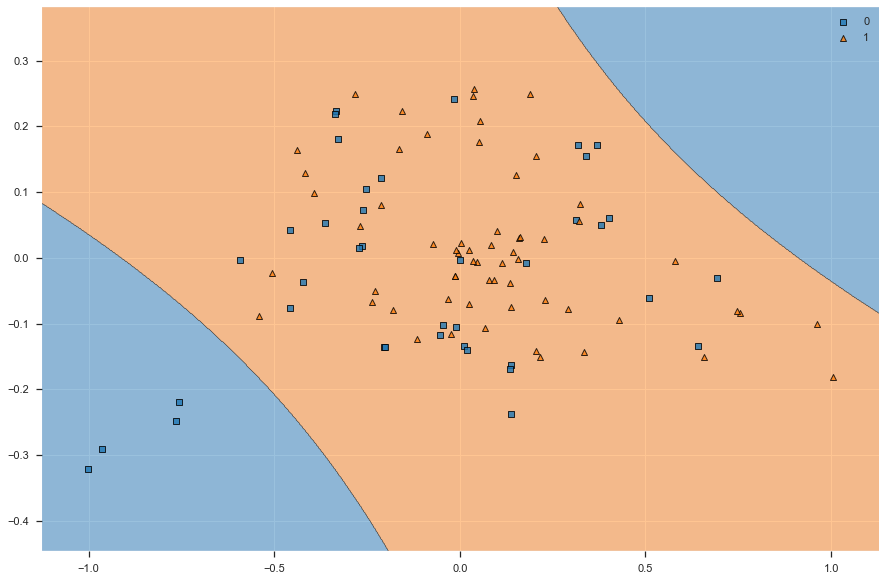

In [79]:
%matplotlib inline
from mlxtend.plotting import plot_decision_regions

X_b = X_train[1500:1600, [2,6]]
y_b = y_train_mat[1500:1600]

model6.fit(X_b, y_b) 

fig = plt.figure(figsize=(15,10))
fig = plot_decision_regions(X_b, y_b, clf = model6, zoom_factor=8)
plt.show()

### Decision Tree Classifier with PCA
We will use Decision Tree with Grid Search and Cross validation to find the best parameters for our model.

In [71]:
from sklearn.tree import DecisionTreeClassifier
#making the instance
model= DecisionTreeClassifier(random_state=42)
#Hyper Parameters Set
params = {'max_features': ['auto', 'sqrt', 'log2'],
          'min_samples_split': [2,3,4,5,6,7,8,9,10,11,12,13,14,15], 
          'min_samples_leaf':[1,2,3,4,5,6,7,8,9,10,11],
          'random_state':[42]}
#Making models with hyper parameters sets
model7 = GridSearchCV(model, param_grid=params, n_jobs=-1)
#Learning
model7.fit(X_train,y_train)
#The best hyper parameters set
print("Best Hyper Parameters:",model7.best_params_)
#Prediction
prediction=model7.predict(X_test)
#importing the metrics module
from sklearn import metrics
#evaluation(Accuracy)
testscore = metrics.accuracy_score(prediction,y_test)
print("Accuracy:",testscore)
#evaluation(Confusion Metrix)
print("Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_test))


#Prediction for Generalization
prediction=model7.predict(X_all)
#evaluation(Accuracy)
genscore = metrics.accuracy_score(prediction,y_all)
print("Generalize Accuracy:",genscore)
#evaluation(Confusion Metrix)
print("Generalize Confusion Metrix:\n",metrics.confusion_matrix(prediction,y_all))

model_performance.loc['Decision Tree Classifier'] = pd.Series({'Test Accuracy':testscore,'Generalize Accuracy':genscore,'Average CV Score':scores.mean(),'Best Parameters':model7.best_params_})

Best Hyper Parameters: {'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 3, 'random_state': 42}
Accuracy: 0.9935
Confusion Metrix:
 [[ 980    5]
 [   8 1007]]
Generalize Accuracy: 0.94061
Generalize Confusion Metrix:
 [[47848  3787]
 [ 2152 46213]]


Let's look at the feautre importance.

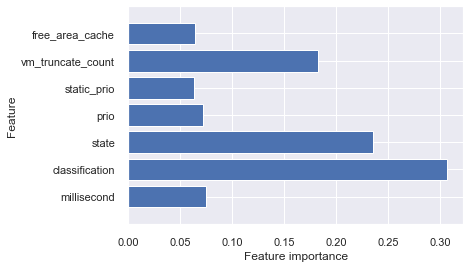

In [72]:
dtree= DecisionTreeClassifier(max_features= 'auto', min_samples_leaf= 3, min_samples_split= 11, random_state=42)
dtree.fit(X_train,y_train)
%matplotlib inline
def plot_feature_importances(model):
    n_features = X_train.shape[1]
    plt.barh(range(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), non_zero_varibales)
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)

plot_feature_importances(dtree)

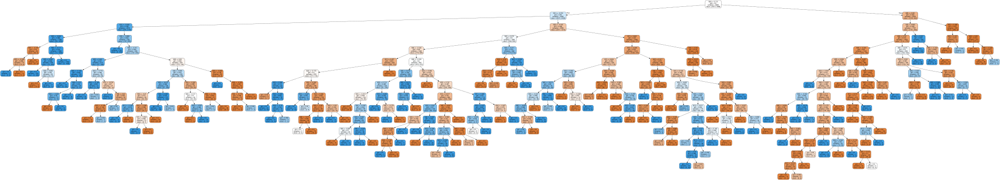

In [73]:
import os 
import graphviz

# Create DOT data
from sklearn.tree import export_graphviz

os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'

dot_data = export_graphviz(dtree, out_file=None, filled=True, rounded=True) 
# Draw graph
graph = graphviz.Source(dot_data) 

# Show graph
graph 

In [80]:
model_performance.style.set_properties(**{'width': '300px'})
# model_performance

,Test Accuracy,Generalize Accuracy,Average CV Score,Best Parameters
KNN Classifier,1,0.99972,0.997875,"{'algorithm': 'auto', 'leaf_size': 1, 'n_jobs': -1, 'n_neighbors': 1, 'weights': 'uniform'}"
Logistic Regression,0.8745,0.88045,0.997875,"{'C': 59.94842503189409, 'penalty': 'l1'}"
Linear SVM Classifier,0.867,0.87344,0.997875,{'C': 2.7825594022071245}
SVM with Linear Kernel,0.883,0.88773,0.997875,"{'C': 1000, 'gamma': 0.01}"
SVM with rbf Kernel,0.999,0.97775,0.997875,"{'C': 10000.0, 'gamma': 1}"
SVM with Polynomial Kernel,0.982,0.96809,0.997875,"{'C': 10, 'degree': 3, 'gamma': 1}"
Decision Tree Classifier,0.9935,0.94061,0.997875,"{'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 3, 'random_state': 42}"


### For our case, KNN Classifier with K=1 seems to be performing very well. We Trained on 8K rows, tested on 2K rows and used 90K to check for model generalization.

Let's check and compare the results with and without PCA.

In [82]:
model_performance_no_PCA = pd.read_csv('Model.csv')

In [83]:
model_performance_no_PCA.style.set_properties(**{'width': '300px'})

,Unnamed: 0,Test Accuracy,Generalize Accuracy,Average CV Score,Best Parameters
0,KNN Classifier,1,0.99906,0.998125,"{'algorithm': 'auto', 'leaf_size': 1, 'n_jobs': -1, 'n_neighbors': 3, 'weights': 'distance'}"
1,Logistic Regression,0.9375,0.9222,0.998125,"{'C': 59.94842503189409, 'penalty': 'l2'}"
2,Linear SVM Classifier,0.9385,0.92317,0.998125,{'C': 21.544346900318832}
3,SVM with Linear Kernel,0.948,0.90927,0.998125,"{'C': 10, 'gamma': 0.01}"
4,SVM with rbf Kernel,0.9985,0.98422,0.998125,"{'C': 166.81005372000593, 'gamma': 1}"
5,SVM with Polynomial Kernel,0.998,0.97718,0.998125,"{'C': 59.94842503189409, 'degree': 3, 'gamma': 1}"
6,Decision Tree Classifier,0.9945,0.98087,0.998125,"{'max_features': 'auto', 'min_samples_leaf': 3, 'min_samples_split': 11, 'random_state': 42}"


We see that models performed better with PCA.

#### Deep Learning Model

In [104]:
# import tensorflow.compat.v1 as tf
# tf.disable_v2_behavior()
# from keras.models import Sequential
# from keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.python.keras.layers import Input, Dense
# from tensorflow.python.keras import backend as k
# from tensorflow import keras
# from keras.layers import Dense

In [105]:
X = data.drop('classification', axis=1)
y = data['classification']

We will split the data in train and test using 80:20 split. Also apply scaling.

In [106]:
X_train_org, X_test_org, y_train, y_test = train_test_split(X, y, random_state = 0, test_size = 0.2)

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train_org)
X_test = scaler.transform(X_test_org)

In [109]:
model = Sequential()
model.add(Dense(12, input_dim=22, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
# Compile model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
# Fit the model
model.fit(X_train, y_train, epochs=20, batch_size=10)

Train on 8000 samples
Epoch 1/20
8000/8000 [==============================] - 5s 672us/sample - loss: 0.5250 - acc: 0.7421
Epoch 2/20
8000/8000 [==============================] - 6s 705us/sample - loss: 0.3158 - acc: 0.8984
Epoch 3/20
8000/8000 [==============================] - 6s 729us/sample - loss: 0.2387 - acc: 0.9128
Epoch 4/20
8000/8000 [==============================] - 6s 756us/sample - loss: 0.2042 - acc: 0.9289
Epoch 5/20
8000/8000 [==============================] - 6s 782us/sample - loss: 0.1765 - acc: 0.9436
Epoch 6/20
8000/8000 [==============================] - 6s 702us/sample - loss: 0.1510 - acc: 0.9540
Epoch 7/20
8000/8000 [==============================] - 5s 650us/sample - loss: 0.1267 - acc: 0.9590
Epoch 8/20
8000/8000 [==============================] - 5s 668us/sample - loss: 0.1036 - acc: 0.9665
Epoch 9/20
8000/8000 [==============================] - 5s 669us/sample - loss: 0.0826 - acc: 0.9731
Epoch 10/20
8000/8000 [==============================] - 5s 676us/sam

In [110]:
# evaluate the model
scores = model.evaluate(X_test, y_test)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

2000/2000 [==============================] - 0s 116us/sample - loss: 0.0220 - acc: 0.9870

acc: 98.70%


In [112]:
y_predict = model.predict(X_test)
y_predict

array([[0.99991375],
       [0.00229236],
       [0.0032599 ],
       ...,
       [0.99508995],
       [0.00677368],
       [1.        ]], dtype=float32)

## 2. Regression Task

# Life Expectancy (WHO)
Statistical Analysis on factors influencing Life Expectancy

# Dataset description:

The Global Health Observatory (GHO) data repository under World Health Organization (WHO) keeps track of the health status as well as many other related factors for all countries. The dataset related to life expectancy, health factors for 193 countries has been collected from the same WHO data repository website and its corresponding economic data was collected from United Nation website. Among all categories of health-related factors only those critical factors were chosen which are more representative. It has been observed that in the past 15 years , there has been a huge development in health sector resulting in improvement of human mortality rates especially in the developing nations in comparison to the past 30 years. Therefore, in this project we have considered data from year 2000-2015 for 193 countries for further analysis.

### Datasource link-  https://www.kaggle.com/kumarajarshi/life-expectancy-who

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.preprocessing  import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import LinearSVR
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

In [2]:
from sklearn.ensemble import BaggingRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA


In [3]:
#import dataset
who =pd.read_csv("WHO.csv")
who.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [4]:
who.shape

(2938, 22)

In [5]:
who.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
Country                            2938 non-null object
Year                               2938 non-null int64
Status                             2938 non-null object
Life expectancy                    2928 non-null float64
Adult Mortality                    2928 non-null float64
infant deaths                      2938 non-null int64
Alcohol                            2744 non-null float64
percentage expenditure             2938 non-null float64
Hepatitis B                        2385 non-null float64
Measles                            2938 non-null int64
 BMI                               2904 non-null float64
under-five deaths                  2938 non-null int64
Polio                              2919 non-null float64
Total expenditure                  2712 non-null float64
Diphtheria                         2919 non-null float64
 HIV/AIDS                          2938 non-null

###  Renaming  column names as they contain spaces in between 

In [6]:
who.rename(columns={" BMI ":"BMI","Life expectancy ":"Life_Expectancy","Adult Mortality":"Adult_Mortality",
                   "infant deaths":"Infant_Deaths","percentage expenditure":"Percent_Exp","Hepatitis B":"HepatitisB",
                  "Measles ":"Measles"," BMI ":"BMI","under-five deaths ":"Under_Five_Deaths","Diphtheria ":"Diphtheria",
                  " HIV/AIDS":"HIV/AIDS"," thinness  1-19 years":"thinness_1to19"," thinness 5-9 years":"thinness_5to9","Income composition of resources":"Income_Comp_Of_Resources",
                   "Total expenditure":"Total_Exp"},inplace=True)

In [7]:
missing_percent = who.isnull().sum() * 100 / len(who)
who.isnull().mean() * 100

Country                      0.000000
Year                         0.000000
Status                       0.000000
Life_Expectancy              0.340368
Adult_Mortality              0.340368
Infant_Deaths                0.000000
Alcohol                      6.603131
Percent_Exp                  0.000000
HepatitisB                  18.822328
Measles                      0.000000
BMI                          1.157250
Under_Five_Deaths            0.000000
Polio                        0.646698
Total_Exp                    7.692308
Diphtheria                   0.646698
HIV/AIDS                     0.000000
GDP                         15.248468
Population                  22.191967
thinness_1to19               1.157250
thinness_5to9                1.157250
Income_Comp_Of_Resources     5.684139
Schooling                    5.547992
dtype: float64

In [8]:
who.dropna(inplace= True)

In [9]:
who.isnull().sum().values.sum()

0

###  Mapping  'Developing':0,'Developed':1 in the Column 'Status' 

In [10]:
who['Status']=who['Status'].map({'Developing':0,'Developed':1})

### Dropping country since it has 193 unique values

In [11]:
who.drop(['Country'],axis=1,inplace=True)

In [12]:
who.describe() 

,Year,Status,Life_Expectancy,Adult_Mortality,Infant_Deaths,Alcohol,Percent_Exp,HepatitisB,Measles,BMI,...,Polio,Total_Exp,Diphtheria,HIV/AIDS,GDP,Population,thinness_1to19,thinness_5to9,Income_Comp_Of_Resources,Schooling
count,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,...,1649.000000,1649.000000,1649.000000,1649.000000,1649.000000,1.649000e+03,1649.000000,1649.000000,1649.000000,1649.000000
mean,2007.840509,0.146756,69.302304,168.215282,32.553062,4.533196,698.973558,79.217708,2224.494239,38.128623,...,83.564585,5.955925,84.155246,1.983869,5566.031887,1.465363e+07,4.850637,4.907762,0.631551,12.119891
std,4.087711,0.353969,8.796834,125.310417,120.847190,4.029189,1759.229336,25.604664,10085.802019,19.754249,...,22.450557,2.299385,21.579193,6.032360,11475.900117,7.046039e+07,4.599228,4.653757,0.183089,2.795388
min,2000.000000,0.000000,44.000000,1.000000,0.000000,0.010000,0.000000,2.000000,0.000000,2.000000,...,3.000000,0.740000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,4.200000
25%,2005.000000,0.000000,64.400000,77.000000,1.000000,0.810000,37.438577,74.000000,0.000000,19.500000,...,81.000000,4.410000,82.000000,0.100000,462.149650,1.918970e+05,1.600000,1.700000,0.509000,10.300000
50%,2008.000000,0.000000,71.700000,148.000000,3.000000,3.790000,145.102253,89.000000,15.000000,43.700000,...,93.000000,5.840000,92.000000,0.100000,1592.572182,1.419631e+06,3.000000,3.200000,0.673000,12.300000
75%,2011.000000,0.000000,75.000000,227.000000,22.000000,7.340000,509.389994,96.000000,373.000000,55.800000,...,97.000000,7.470000,97.000000,0.700000,4718.512910,7.658972e+06,7.100000,7.100000,0.751000,14.000000
max,2015.000000,1.000000,89.000000,723.000000,1600.000000,17.870000,18961.348600,99.000000,131441.000000,77.100000,...,99.000000,14.390000,99.000000,50.600000,119172.741800,1.293859e+09,27.200000,28.200000,0.936000,20.700000


### Dropping insignificant columns

In [13]:
who_new =who.drop(columns=['Under_Five_Deaths','thinness_5to9','Percent_Exp'],axis =1)

### Correlation of all the variables with respect to each other

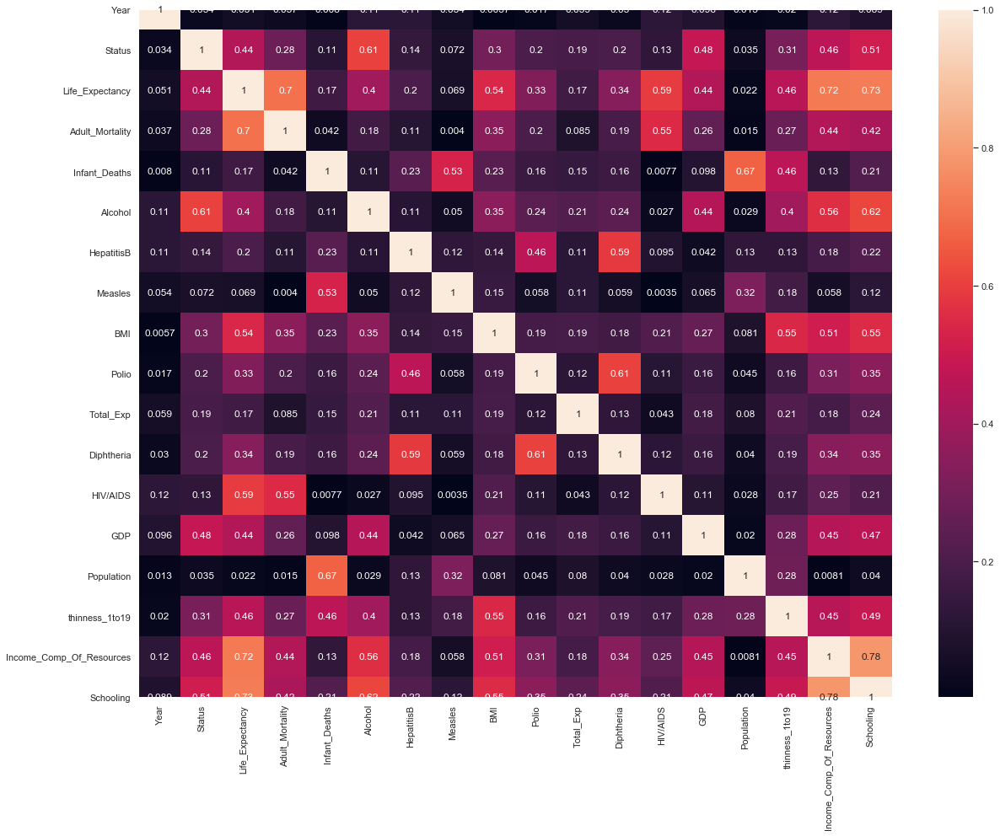

In [14]:
sns.set(rc={'figure.figsize':(20,15)})
sns.heatmap(who_new.corr().abs(),annot=True)

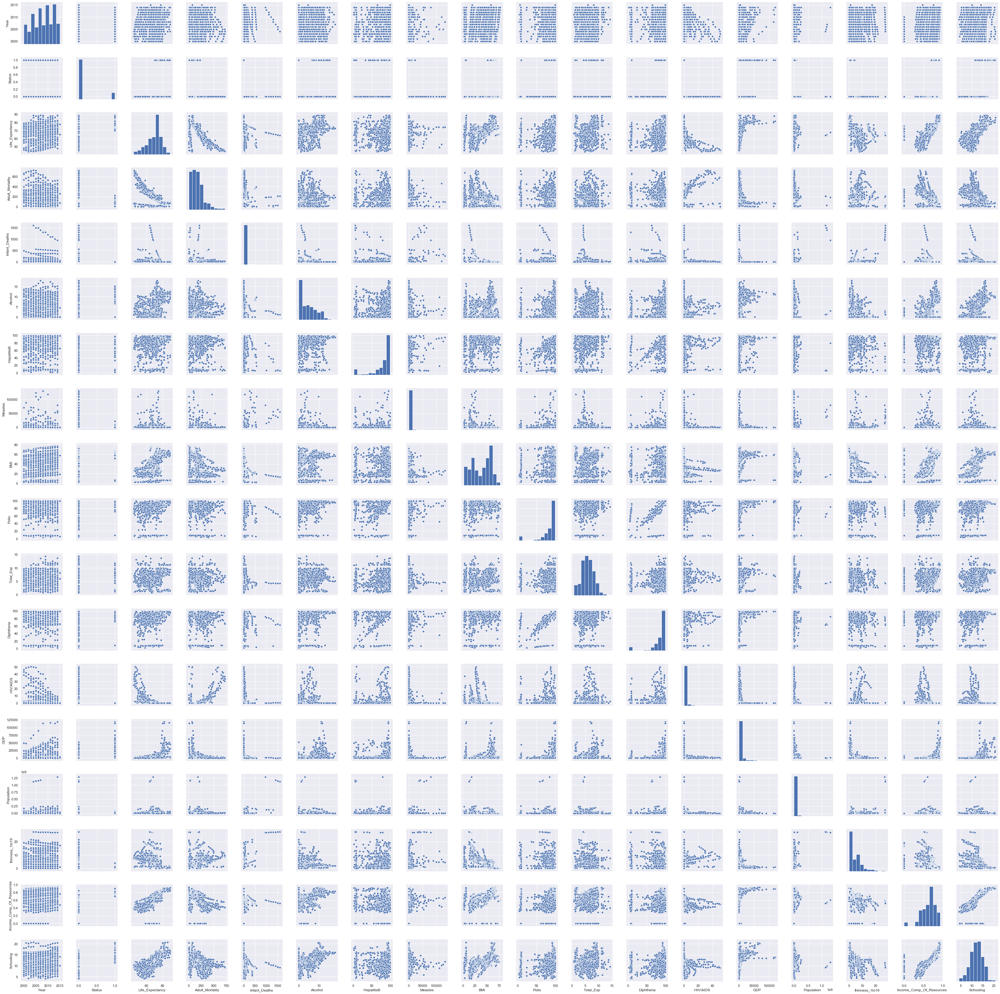

In [15]:
sns.pairplot(who_new)
plt.show()

In [16]:
# target variable is Life Expectancy
X = who_new.drop(['Life_Expectancy'],axis =1)

y = who_new['Life_Expectancy']

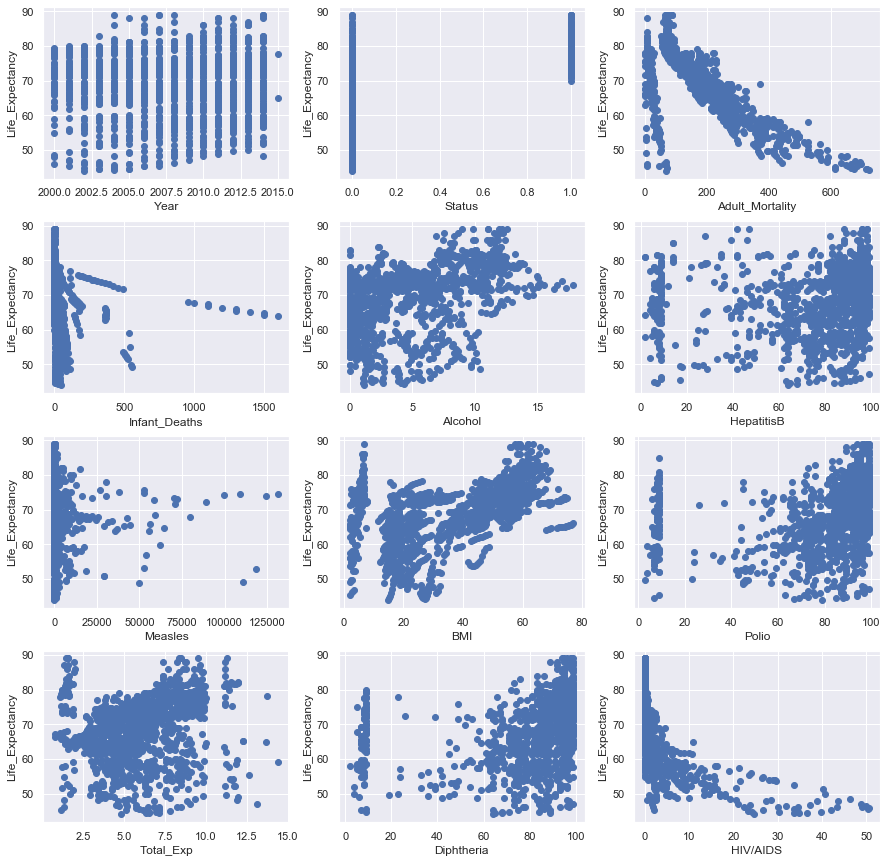

In [17]:
# generating scatter plot for each variable against target variable
import numpy as np
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(15,15))

columns = 3
rows = 4

for i in range(1, 15):
    if(i<13):
        fig.add_subplot(rows, columns, i)
        plt.scatter(x=X.columns[i-1], y='Life_Expectancy',data=who)
        plt.xlabel(X.columns[i-1])
        plt.ylabel('Life_Expectancy')
        plt.subplots_adjust(hspace=.25)
    else:
        break

plt.show()

###### Data Imputation

In [18]:
# Imputing median and mode value of the column for missing rows
who_new.loc[:,['Alcohol', 'HepatitisB', 'BMI', 'Life_Expectancy','Adult_Mortality', 'Polio', 'Total_Exp', 'Diphtheria', 'GDP', 'Population', 'thinness_1to19', 'Income_Comp_Of_Resources', 'Schooling']]=who_new.loc[:,['Alcohol', 'HepatitisB', 'BMI','Life_Expectancy','Adult_Mortality', 'Polio', 'Total_Exp', 'Diphtheria', 'GDP', 'Population', 'thinness_1to19','Income_Comp_Of_Resources', 'Schooling']].fillna(who_new.loc[:,['Alcohol', 'HepatitisB', 'BMI', 'Life_Expectancy','Adult_Mortality','Polio', 'Total_Exp', 'Diphtheria', 'GDP', 'Population', 'thinness_1to19', 'Income_Comp_Of_Resources', 'Schooling']].median())
who_new = who_new.fillna(who_new.mode().iloc[0])

In [19]:
who_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1649 entries, 0 to 2937
Data columns (total 18 columns):
Year                        1649 non-null int64
Status                      1649 non-null int64
Life_Expectancy             1649 non-null float64
Adult_Mortality             1649 non-null float64
Infant_Deaths               1649 non-null int64
Alcohol                     1649 non-null float64
HepatitisB                  1649 non-null float64
Measles                     1649 non-null int64
BMI                         1649 non-null float64
Polio                       1649 non-null float64
Total_Exp                   1649 non-null float64
Diphtheria                  1649 non-null float64
HIV/AIDS                    1649 non-null float64
GDP                         1649 non-null float64
Population                  1649 non-null float64
thinness_1to19              1649 non-null float64
Income_Comp_Of_Resources    1649 non-null float64
Schooling                   1649 non-null float64
d

In [20]:
who_new.shape

(1649, 18)

### Scaling

In [21]:
lmodel_performance = pd.DataFrame(columns=['Train Score','Test Score','Best Parameters', 'RMSE', 'Cross Validation Score'])

In [22]:
# target variable is 'Life_Expectancy'
X_train_org, X_test_org, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 0)

# Splitting data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train_org)
X_test = scaler.transform(X_test_org)
print("X_train shape: ",X_train.shape)
print("y_train shape: ",y_train.shape)
print("X_test shape: ",X_test.shape)
print("y_test shape",y_test.shape)

X_train shape:  (1319, 17)
y_train shape:  (1319,)
X_test shape:  (330, 17)
y_test shape (330,)


## 1st Model (Decision Tree) with bagging and pasting

### [1] Decision Tree with Bagging

In [23]:
from sklearn.ensemble import BaggingRegressor
dt = DecisionTreeRegressor(random_state=0,max_depth=9,min_samples_leaf=6)
bag_dt = BaggingRegressor(dt, bootstrap= True, random_state = 0,oob_score=True)
bag_dt.fit(X_train,y_train)

C:\Users\HP\Anaconda3\lib\site-packages\sklearn\ensemble\bagging.py:1011: UserWarning: Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


BaggingRegressor(base_estimator=DecisionTreeRegressor(criterion='mse',
                                                      max_depth=9,
                                                      max_features=None,
                                                      max_leaf_nodes=None,
                                                      min_impurity_decrease=0.0,
                                                      min_impurity_split=None,
                                                      min_samples_leaf=6,
                                                      min_samples_split=2,
                                                      min_weight_fraction_leaf=0.0,
                                                      presort=False,
                                                      random_state=0,
                                                      splitter='best'),
                 bootstrap=True, bootstrap_features=False, max_features=1.0,
                 max_samples=1.0,

### Apply grid search on bagging to find best parameter 

In [24]:
grid_param ={'max_samples' :[200,500,1000],
             'max_features':[5, 7, 9],
             'n_estimators' :[10,50,100, 200, 500]
            }
dt_grid =GridSearchCV(bag_dt,grid_param, cv=5)
dt_grid.fit(X_train,y_train)
best_parameters=dt_grid.best_params_

C:\Users\HP\Anaconda3\lib\site-packages\sklearn\ensemble\bagging.py:1011: UserWarning: Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
C:\Users\HP\Anaconda3\lib\site-packages\sklearn\ensemble\bagging.py:1011: UserWarning: Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
C:\Users\HP\Anaconda3\lib\site-packages\sklearn\ensemble\bagging.py:1011: UserWarning: Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "
C:\Users\HP\Anaconda3\lib\site-packages\sklearn\ensemble\bagging.py:1011: UserWarning: Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.
  warn("Some input

In [25]:
print("GridSearchCV best parameter :",dt_grid.best_params_)

TRbagdt=round(dt_grid.score(X_train,y_train),4)
TSbagdt =round (dt_grid.score(X_test,y_test),4)
print("Train bagging score for DT : {:.4f}".format(dt_grid.score(X_train,y_train)))
print("Test bagging score for DT : {:.4f}".format(dt_grid.score(X_test,y_test)))
y_pred_bagdt =dt_grid.predict(X_test)

RMSE_bagdt = round(np.sqrt(mean_squared_error(y_test,y_pred_bagdt)),4)
r2_bagdt= round(r2_score(y_test,y_pred_bagdt),4)
print('r2_score for DT boosting:',r2_bagdt)



GridSearchCV best parameter : {'max_features': 9, 'max_samples': 1000, 'n_estimators': 50}
Train bagging score for DT : 0.9644
Test bagging score for DT : 0.9514
r2_score for DT boosting: 0.9514


In [26]:
lmodel_performance.loc['Decision Tree Bagging'] = pd.Series({'Train Score':TRbagdt,'Test Score':TSbagdt, 'Best Parameters':best_parameters, 'RMSE': RMSE_bagdt})

In [27]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.9644,0.9514,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN


### Decision Tree with Pasting (using the best parameter)

In [28]:
dt = DecisionTreeRegressor(random_state=0,max_depth=9,min_samples_leaf=6)
Pas_dt = BaggingRegressor(dt, n_estimators=50, bootstrap= False, max_features=9, random_state = 0,max_samples=1000)
Pas_dt.fit(X_train,y_train)

BaggingRegressor(base_estimator=DecisionTreeRegressor(criterion='mse',
                                                      max_depth=9,
                                                      max_features=None,
                                                      max_leaf_nodes=None,
                                                      min_impurity_decrease=0.0,
                                                      min_impurity_split=None,
                                                      min_samples_leaf=6,
                                                      min_samples_split=2,
                                                      min_weight_fraction_leaf=0.0,
                                                      presort=False,
                                                      random_state=0,
                                                      splitter='best'),
                 bootstrap=False, bootstrap_features=False, max_features=9,
                 max_samples=1000,

In [29]:
TR_dt_pas = round(Pas_dt.score(X_train,y_train),4)
TS_dt_pas =round(Pas_dt.score(X_test,y_test),4)
print("Train pasting score for DT : {:.4f}".format(Pas_dt.score(X_train,y_train)))
print("Test bagging score for DT : {:.4f}".format(Pas_dt.score(X_test,y_test)))

y_pred_dt_pas =Pas_dt.predict(X_test)

RMSE_dt_pas= round(np.sqrt(mean_squared_error(y_test,y_pred_dt_pas)),4)
r2_dt_pas= round(r2_score(y_test,y_pred_dt_pas),4)
print('r2_score for DT pasting: ',r2_dt_pas)


Train pasting score for DT : 0.9758
Test bagging score for DT : 0.9576
r2_score for DT pasting:  0.9576


In [30]:
lmodel_performance.loc['Decision Tree Pasting'] = pd.Series({'Train Score':  TR_dt_pas,'Test Score': TS_dt_pas, 'Best Parameters':  '-', 'RMSE':   RMSE_dt_pas})

In [31]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.9644,0.9514,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.9758,0.9576,-,1.9150,NaN


## 2nd Model (Kernelized SVM) with bagging and pasting

### Kernelized SVR with bagging

In [32]:
kernelized_svr = SVR(C=100,gamma=1,kernel ='rbf')
bagKSVR = BaggingRegressor(kernelized_svr,random_state = 0,bootstrap= True,oob_score =True)
bagKSVR.fit(X_train,y_train)

C:\Users\HP\Anaconda3\lib\site-packages\sklearn\ensemble\bagging.py:1011: UserWarning: Some inputs do not have OOB scores. This probably means too few estimators were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


BaggingRegressor(base_estimator=SVR(C=100, cache_size=200, coef0=0.0, degree=3,
                                    epsilon=0.1, gamma=1, kernel='rbf',
                                    max_iter=-1, shrinking=True, tol=0.001,
                                    verbose=False),
                 bootstrap=True, bootstrap_features=False, max_features=1.0,
                 max_samples=1.0, n_estimators=10, n_jobs=None, oob_score=True,
                 random_state=0, verbose=0, warm_start=False)

In [33]:
grid_param_KSVR ={'max_samples' :[100,200],
                'max_features':[5,6],
                'n_estimators' :[100,200]
                }

KSVM_grid =GridSearchCV(bagKSVR,grid_param_KSVR, cv=5)
KSVM_grid.fit(X_train,y_train)
best_parameters_KSVMbag = KSVM_grid.best_params_
print("bagging best parameter",KSVM_grid.best_params_)

bagging best parameter {'max_features': 5, 'max_samples': 200, 'n_estimators': 100}


In [34]:
TR_KSVMbag =round(KSVM_grid.score(X_train,y_train),4)
TS_KSVMbag =round(KSVM_grid.score(X_test,y_test),4)

print("Train Boosting score for Kernelized SVR : {:.4f}".format(KSVM_grid.score(X_train,y_train)))
print("Test Boosting score for Kernelized SVR: {:.4f}".format(KSVM_grid.score(X_test,y_test)))

y_pred_KSVMbag =KSVM_grid.predict(X_test)

RMSE_KSVMbag = round(np.sqrt(mean_squared_error(y_test,y_pred_KSVMbag)),4)
print('rmse score:', RMSE_KSVMbag )
r2_KSVMbag = round(r2_score(y_test,y_pred_KSVMbag),4)
print('r2_score for Kernelized SVM bagging: ',r2_KSVMbag)


Train Boosting score for Kernelized SVR : 0.8624
Test Boosting score for Kernelized SVR: 0.8130
rmse score: 4.0196
r2_score for Kernelized SVM bagging:  0.813


In [35]:
lmodel_performance.loc['KSVM Bagging'] = pd.Series({'Train Score':TR_KSVMbag,'Test Score':TS_KSVMbag, 'Best Parameters':best_parameters_KSVMbag, 'RMSE': RMSE_KSVMbag})

In [36]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.9644,0.9514,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.9758,0.9576,-,1.9150,NaN
KSVM Bagging,0.8624,0.8130,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN


### Kernelized SVR with Pasting(using best parameter)

In [37]:
kernelized_svr = SVR(C=100,gamma=1,kernel ='rbf')
pas_KSVR = BaggingRegressor(kernelized_svr, n_estimators=500, bootstrap= False, max_features=10, random_state = 0,max_samples=1000)
pas_KSVR.fit(X_train,y_train)


BaggingRegressor(base_estimator=SVR(C=100, cache_size=200, coef0=0.0, degree=3,
                                    epsilon=0.1, gamma=1, kernel='rbf',
                                    max_iter=-1, shrinking=True, tol=0.001,
                                    verbose=False),
                 bootstrap=False, bootstrap_features=False, max_features=10,
                 max_samples=1000, n_estimators=500, n_jobs=None,
                 oob_score=False, random_state=0, verbose=0, warm_start=False)

In [38]:
TR_KSVM_pas =round(pas_KSVR.score(X_train,y_train),4)
TS_KSVM_pas =round(pas_KSVR.score(X_test,y_test),4)
print("Train pasting score for Kernelized SVR : {:.4f}".format(pas_KSVR.score(X_train,y_train)))
print("Test pasting score for Kernelized SVR: {:.4f}".format(pas_KSVR.score(X_test,y_test)))

y_pred_KSVM_pas =pas_KSVR.predict(X_test)
RMSE_KSVM_pas = round(np.sqrt(mean_squared_error(y_test,y_pred_KSVM_pas)),4)
r2_KSVM_pas = round(r2_score(y_test,y_pred_KSVM_pas),4)

print('r2_score for Kernelized SVM for pasting:',r2_KSVM_pas)


Train pasting score for Kernelized SVR : 0.9882
Test pasting score for Kernelized SVR: 0.8630
r2_score for Kernelized SVM for pasting: 0.863


In [39]:
lmodel_performance.loc['KSVM Pasting'] = pd.Series({'Train Score':TR_KSVM_pas,'Test Score':TS_KSVM_pas, 'Best Parameters':'-', 'RMSE': RMSE_KSVM_pas})

In [40]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.9644,0.9514,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.9758,0.9576,-,1.9150,NaN
KSVM Bagging,0.8624,0.8130,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.9882,0.8630,-,3.4401,NaN


### Decision tree with adaboost boosting

In [41]:
ada_dt = AdaBoostRegressor(dt,random_state=0)
param_grid_ada_dt = {
            'n_estimators':[500,1000],
             'learning_rate':[0.1, 0.5, 1]
            }
ada_grid_dt = GridSearchCV(ada_dt,param_grid_ada_dt,cv=5 )
ada_grid_dt.fit(X_train,y_train)
best_parameters_dt_ada= ada_grid_dt.best_params_
print("Best parameter",ada_grid_dt.best_params_)

Best parameter {'learning_rate': 0.5, 'n_estimators': 500}


In [42]:
TR_dt_ada =round(ada_grid_dt.score(X_train,y_train),4)
TS_dt_ada =round(ada_grid_dt.score(X_test,y_test),4)
print("Train score for DT regressor: {:.4f}".format(ada_grid_dt.score(X_train,y_train)))
print("Test  score for DT regressor: {:.4f}".format(ada_grid_dt.score(X_test,y_test)))
y_pred_dt_ada = ada_grid_dt.predict(X_test)

RMSE_dt_ada = round(np.sqrt(mean_squared_error(y_test,y_pred_dt_ada)),4)
r2_dt_ada = round(r2_score(y_test,y_pred_dt_ada),4)
print('r2_score for DT for adaboosting: ',r2_dt_ada)


Train score for DT regressor: 0.9914
Test  score for DT regressor: 0.9650
r2_score for DT for adaboosting:  0.965


In [43]:
lmodel_performance.loc['DT Ada Boosting'] = pd.Series({'Train Score':TR_dt_ada,'Test Score':TS_dt_ada, 'Best Parameters':best_parameters_dt_ada, 'RMSE': RMSE_dt_ada})

In [44]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.9644,0.9514,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.9758,0.9576,-,1.9150,NaN
KSVM Bagging,0.8624,0.8130,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.9882,0.8630,-,3.4401,NaN
DT Ada Boosting,0.9914,0.9650,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN


### Kernelized SVM with Ada boosting

In [45]:
ada_KSVM = AdaBoostRegressor(kernelized_svr,random_state=0)
param_grid_ada_KSVM = {
            'n_estimators':[10, 20, 50,100],
             'learning_rate':[0.1,0.5]
            }
ada_grid_KSVM = GridSearchCV(ada_KSVM,param_grid_ada_KSVM ,cv=5)
ada_grid_KSVM.fit(X_train,y_train)
best_parameters_KSVM_ada= ada_grid_KSVM.best_params_
print("Best parameter",ada_grid_KSVM.best_params_)

Best parameter {'learning_rate': 0.1, 'n_estimators': 100}


In [46]:
TR_KSVM_ada = round(ada_grid_KSVM.score(X_train,y_train),4)
TS_KSVM_ada =round(ada_grid_KSVM.score(X_test,y_test),4)
print("Train score for KSVM regressor: {:.4f}".format(ada_grid_KSVM.score(X_train,y_train)))
print("Test  score for KSVM regressor: {:.4f}".format(ada_grid_KSVM.score(X_test,y_test)))

y_pred_KSVM_ada = ada_grid_KSVM.predict(X_test)
RMSE_KSVM_ada= round(np.sqrt(mean_squared_error(y_test,y_pred_KSVM_ada)),4)

r2_KSVM_ada = round(r2_score(y_test,y_pred_KSVM_ada),4)
print('r2_score for KSVM for adaboosting: ',r2_KSVM_ada)


Train score for KSVM regressor: 0.9991
Test  score for KSVM regressor: 0.5381
r2_score for KSVM for adaboosting:  0.5381


In [47]:
lmodel_performance.loc['KSVM Ada Boosting'] = pd.Series({'Train Score':TR_KSVM_ada,'Test Score':TS_KSVM_ada, 'Best Parameters':best_parameters_KSVM_ada, 'RMSE': RMSE_KSVM_ada})

In [48]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.9644,0.9514,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.9758,0.9576,-,1.9150,NaN
KSVM Bagging,0.8624,0.8130,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.9882,0.8630,-,3.4401,NaN
DT Ada Boosting,0.9914,0.9650,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN
KSVM Ada Boosting,0.9991,0.5381,"{'learning_rate': 0.1, 'n_estimators': 100}",6.3176,NaN


## Gradient boosting 

In [49]:
gd_reg = GradientBoostingRegressor(random_state=0)
param_grid_gb = {
            'n_estimators':[100,200,500],
             'learning_rate':[0.1, 0.5],
              'max_depth':range(1,10)
            }

grid_gb_reg=GridSearchCV(gd_reg,param_grid_gb,cv=5)
grid_gb_reg.fit(X_train,y_train)

best_parameters_gb = grid_gb_reg.best_params_
print(" GB best parameter: ",grid_gb_reg.best_params_)

 GB best parameter:  {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 500}


In [50]:
TR_gb = round(grid_gb_reg.score(X_train,y_train),4)
TS_gb =round(grid_gb_reg.score(X_test,y_test),4)
print("Train score for GB regressor: {:.4f}".format(grid_gb_reg.score(X_train,y_train)))
print("Test  score for GB regressor: {:.4f}".format(grid_gb_reg.score(X_test,y_test)))
y_pred_GB = grid_gb_reg.predict(X_test)

RMSE_gb= round(np.sqrt(mean_squared_error(y_test,y_pred_GB)),4)
r2_GB =round(r2_score(y_test,y_pred_GB),4)
print('r2_score for Gradient Boosting: ',r2_GB)


Train score for GB regressor: 1.0000
Test  score for GB regressor: 0.9613
r2_score for Gradient Boosting:  0.9613


In [51]:
lmodel_performance.loc['Gradient Boosting'] = pd.Series({'Train Score':TR_gb,'Test Score':TS_gb, 'Best Parameters':best_parameters_gb, 'RMSE': RMSE_gb})

In [52]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.9644,0.9514,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.9758,0.9576,-,1.9150,NaN
KSVM Bagging,0.8624,0.8130,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.9882,0.8630,-,3.4401,NaN
DT Ada Boosting,0.9914,0.9650,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN
KSVM Ada Boosting,0.9991,0.5381,"{'learning_rate': 0.1, 'n_estimators': 100}",6.3176,NaN
Gradient Boosting,1.0000,0.9613,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",1.8282,NaN


## PCA

In [53]:
pca = PCA(n_components= 0.95)
pca.fit(X_train)
X_train_red = pca.transform(X_train)
X_test_red = pca.transform(X_test)

Text(0, 0.5, 'Cumulative explained variance')

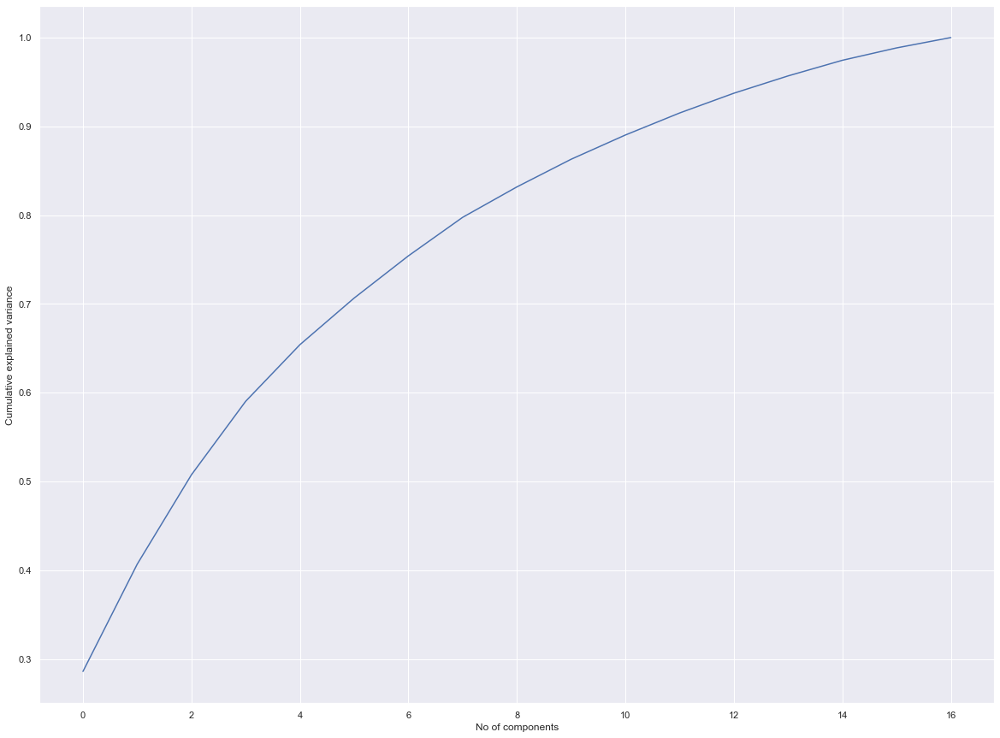

In [54]:
pca=PCA().fit(X_train)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("No of components")
plt.ylabel("Cumulative explained variance")

In [55]:
X_train.shape

(1319, 17)

In [56]:
X_train_red.shape

(1319, 14)

features have been reduced from 17 to 14

### Linear Regression

In [57]:
from sklearn.model_selection import cross_val_score
lreg =LinearRegression()
lreg.fit(X_train_red, y_train)
y_pred_linear_pca=lreg.predict(X_test_red)

TR_linear_pca =round(lreg.score(X_train_red, y_train),4)
TS_linear_pca =round(lreg.score(X_test_red, y_test),4)
print('Train score: {:.4f} '.format(lreg.score(X_train_red, y_train)))
print('Test score: {:.4f} '.format(lreg.score(X_test_red, y_test)))

RMSE_Linear_pca= round(np.sqrt(mean_squared_error(y_test,y_pred_linear_pca)),4)
print('RMSE: ',RMSE_Linear_pca)

r2_Linear_pca= round(r2_score(y_test,y_pred_linear_pca),4)
print('r2_score: ',r2_Linear_pca)


Train score: 0.8169 
Test score: 0.8287 
RMSE:  3.8476
r2_score:  0.8287


In [58]:
# cross validation
from sklearn.model_selection import cross_val_score

scores = cross_val_score(LinearRegression(), X_train_red, y_train,cv=3)
print("Cross-validation scores: {}".format(scores))
print("Average train cross-validation score: {:.4f}".format(scores.mean()))

scores = cross_val_score(LinearRegression(), X_test_red, y_test,cv=3)
print("Cross-validation scores: {}".format(scores))
print("Average test cross-validation score: {:.4f}".format(scores.mean()))


Cross-validation scores: [0.8196731  0.80367853 0.80432531]
Average train cross-validation score: 0.8092
Cross-validation scores: [0.83025219 0.80535449 0.7824806 ]
Average test cross-validation score: 0.8060


In [59]:
lmodel_performance.loc['Linear Regression'] = pd.Series({'Train Score':TR_linear_pca,'Test Score':TS_linear_pca, 'Best Parameters':'-', 'RMSE': RMSE_Linear_pca, 'Cross Validation Score':scores.mean()})

In [60]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.9644,0.9514,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.9758,0.9576,-,1.9150,NaN
KSVM Bagging,0.8624,0.8130,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.9882,0.8630,-,3.4401,NaN
DT Ada Boosting,0.9914,0.9650,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN
KSVM Ada Boosting,0.9991,0.5381,"{'learning_rate': 0.1, 'n_estimators': 100}",6.3176,NaN
Gradient Boosting,1.0000,0.9613,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",1.8282,NaN
Linear Regression,0.8169,0.8287,-,3.8476,0.806029


### KNN Regression

In [61]:
train_score_array = []
test_score_array = []

for k in range(1,15):
    knn_pca = KNeighborsRegressor(k)
    knn_pca.fit(X_train_red, y_train)
    train_score_array.append(knn_pca.score(X_train_red, y_train))
    test_score_array.append(knn_pca.score(X_test_red, y_test))
train_score = knn_pca.score(X_train_red,y_train)
print('Train score: ',train_score)
test_score = knn_pca.score(X_test_red, y_test)
print('Test score: ',test_score)


Train score:  0.8739058756039825
Test score:  0.868953275196132


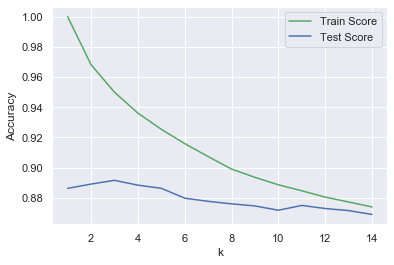

In [62]:
x_axis = range(1,15)
%matplotlib inline
plt.plot(x_axis, train_score_array, label = 'Train Score', c = 'g')
plt.plot(x_axis, test_score_array, label = 'Test Score', c='b')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.legend()

In [64]:
para_grid = {'n_neighbors': [1, 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]}
gridsearch = GridSearchCV(KNeighborsRegressor(), para_grid, cv=15, return_train_score=True)

gridsearch.fit(X_train_red, y_train)
print("Best parameters: {}".format(gridsearch.best_params_))
print("Best cross-validation score: {:.4f}".format(gridsearch.best_score_))

y_pred_knn_pca=gridsearch.predict(X_test_red)
RMSE_Knn_pca= round(np.sqrt(mean_squared_error(y_test,y_pred_knn_pca)),4)
print('RMSE: ',RMSE_Knn_pca)

Best parameters: {'n_neighbors': 3}
Best cross-validation score: 0.8805
RMSE:  3.0612


In [65]:
lmodel_performance.loc['KNN Regression'] = pd.Series({'Train Score':train_score,'Test Score':test_score, 'Best Parameters':gridsearch.best_params_, 'RMSE':RMSE_Knn_pca, 'Cross Validation Score':gridsearch.best_score_ })

In [66]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.964400,0.951400,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.975800,0.957600,-,1.9150,NaN
KSVM Bagging,0.862400,0.813000,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.988200,0.863000,-,3.4401,NaN
DT Ada Boosting,0.991400,0.965000,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN
KSVM Ada Boosting,0.999100,0.538100,"{'learning_rate': 0.1, 'n_estimators': 100}",6.3176,NaN
Gradient Boosting,1.000000,0.961300,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",1.8282,NaN
Linear Regression,0.816900,0.828700,-,3.8476,0.806029
KNN Regression,0.873906,0.868953,{'n_neighbors': 3},3.0612,0.880510


### Ridge Regression

In [67]:
ridge=Ridge(random_state=0)
param_grid_ridge = {
            'alpha': [0.001, 0.01, 0.1, 1, 10, 100],
            'fit_intercept': [True,False],
            'normalize': [True,False]}
            
grid_ridge_pca = GridSearchCV(estimator =ridge,cv=5, param_grid = param_grid_ridge , return_train_score=True, verbose = 1, n_jobs = -1)
grid_ridge_pca.fit(X_train_red, y_train)

best_parameters_ridge_pca=grid_ridge_pca.best_params_
print(best_parameters_ridge_pca)

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


{'alpha': 10, 'fit_intercept': True, 'normalize': False}


[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:    5.0s finished


In [68]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(Ridge(alpha=1), X_train_red, y_train,cv=5)
print("Cross-validation scores: {}".format(scores))
print("Average cross-validation score: {:.4f}".format(scores.mean()))

scores = cross_val_score(Ridge(alpha=1), X_test_red, y_test,cv=5)
print("Cross-validation scores: {}".format(scores))
print("Average cross-validation score: {:.4f}".format(scores.mean()))

Cross-validation scores: [0.82595084 0.80410899 0.80363771 0.83530743 0.77836031]
Average cross-validation score: 0.8095
Cross-validation scores: [0.81307359 0.82750565 0.81311085 0.84920233 0.72526386]
Average cross-validation score: 0.8056


In [69]:
y_pred_ridge_pca=grid_ridge_pca.predict(X_test_red)

TR_ridge_pca =round(grid_ridge_pca.score(X_train_red, y_train),4)
TS_ridge_pca =round(grid_ridge_pca.score(X_test_red, y_test),4)
print('Train score: ',TR_ridge_pca)
print('Test score: ',TS_ridge_pca)

RMSE_ridge_pca=round(np.sqrt(mean_squared_error(y_test,y_pred_ridge_pca)),4)
print('RMSE: ',RMSE_ridge_pca)

r2_ridge_pca= round(r2_score(y_test,y_pred_ridge_pca),4)
print('r2_score: ',r2_ridge_pca)


Train score:  0.8169
Test score:  0.829
RMSE:  3.8444
r2_score:  0.829


In [70]:
lmodel_performance.loc['Ridge Regression'] = pd.Series({'Train Score':TR_ridge_pca,'Test Score':TS_ridge_pca, 'Best Parameters': best_parameters_ridge_pca, 'RMSE':RMSE_ridge_pca, 'Cross Validation Score':scores.mean()})

In [71]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.964400,0.951400,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.975800,0.957600,-,1.9150,NaN
KSVM Bagging,0.862400,0.813000,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.988200,0.863000,-,3.4401,NaN
DT Ada Boosting,0.991400,0.965000,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN
KSVM Ada Boosting,0.999100,0.538100,"{'learning_rate': 0.1, 'n_estimators': 100}",6.3176,NaN
Gradient Boosting,1.000000,0.961300,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",1.8282,NaN
Linear Regression,0.816900,0.828700,-,3.8476,0.806029
KNN Regression,0.873906,0.868953,{'n_neighbors': 3},3.0612,0.880510
Ridge Regression,0.816900,0.829000,"{'alpha': 10, 'fit_intercept': True, 'normaliz...",3.8444,0.805631


### Lasso Regression

In [72]:
lasso=Lasso(random_state=0)
param_grid_lasso = {
            'alpha': [0.001, 0.01, 0.1, 1, 10, 100],
            'fit_intercept': [True,False],
            'normalize': [True,False]}
            
grid_lasso_pca = GridSearchCV(estimator =lasso,cv=5, param_grid = param_grid_lasso , return_train_score=True, verbose = 1, n_jobs = -1)
grid_lasso_pca.fit(X_train_red, y_train)

best_parameters_lasso_pca=grid_lasso_pca.best_params_
print("Best Parameters:",  best_parameters_lasso_pca)
print("Best cross-validation score: {:.4f}".format(grid_lasso_pca.best_score_))

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Best Parameters: {'alpha': 0.01, 'fit_intercept': True, 'normalize': False}
Best cross-validation score: 0.8095


[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:    5.1s finished


In [73]:
y_pred_lasso_pca=grid_lasso_pca.predict(X_test_red)

TR_lasso_pca =round(grid_lasso_pca.score(X_train_red, y_train),4)
TS_lasso_pca =round(grid_lasso_pca.score(X_test_red, y_test),4)
print('Train score: ',TR_lasso_pca)
print('Test score: ',TS_lasso_pca)

RMSE_lasso_pca=round(np.sqrt(mean_squared_error(y_test,y_pred_lasso_pca)),4)
print('RMSE: ',RMSE_lasso_pca)

r2_lasso_pca= round(r2_score(y_test,y_pred_lasso_pca),4)
print('r2_score: ',r2_lasso_pca)


Train score:  0.8169
Test score:  0.8289
RMSE:  3.8449
r2_score:  0.8289


In [74]:
lmodel_performance.loc['Lasso Regression'] = pd.Series({'Train Score':TR_lasso_pca,'Test Score':TS_lasso_pca, 'Best Parameters': best_parameters_lasso_pca, 'RMSE':RMSE_lasso_pca, 'Cross Validation Score': grid_lasso_pca.best_score_})

In [75]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.964400,0.951400,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.975800,0.957600,-,1.9150,NaN
KSVM Bagging,0.862400,0.813000,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.988200,0.863000,-,3.4401,NaN
DT Ada Boosting,0.991400,0.965000,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN
KSVM Ada Boosting,0.999100,0.538100,"{'learning_rate': 0.1, 'n_estimators': 100}",6.3176,NaN
Gradient Boosting,1.000000,0.961300,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",1.8282,NaN
Linear Regression,0.816900,0.828700,-,3.8476,0.806029
KNN Regression,0.873906,0.868953,{'n_neighbors': 3},3.0612,0.880510
Ridge Regression,0.816900,0.829000,"{'alpha': 10, 'fit_intercept': True, 'normaliz...",3.8444,0.805631


### Polynomial Regression

In [76]:
poly = PolynomialFeatures(degree=2)
lreg_poly_pca =LinearRegression()
X_train_reduced_poly =poly.fit_transform(X_train_red)
X_test_reduced_poly =poly.fit_transform(X_test_red)
lreg_poly_pca.fit(X_train_reduced_poly, y_train)

param_grid_poly = {
            'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True, False]
            }
grid_poly_pca = GridSearchCV(estimator =lreg_poly_pca,cv=5 ,param_grid=param_grid_poly, verbose=1, n_jobs=-1, scoring= None)
grid_poly_pca.fit(X_train_reduced_poly, y_train)

best_parameters_poly_pca=grid_poly_pca.best_params_
print(best_parameters_poly_pca)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


{'copy_X': True, 'fit_intercept': False, 'normalize': True}


[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


In [77]:

scores = cross_val_score(LinearRegression(), X_train_reduced_poly, y_train,cv=4)
print("Cross-validation scores: {}".format(scores))
print("Average cross-validation score: {:.4f}".format(scores.mean()))

scores = cross_val_score(LinearRegression(), X_test_reduced_poly, y_test,cv=4)
print("Cross-validation scores: {}".format(scores))
print("Average cross-validation score: {:.4f}".format(scores.mean()))

Cross-validation scores: [0.86842207 0.86332881 0.86361154 0.82924904]
Average cross-validation score: 0.8562
Cross-validation scores: [-0.73067599  0.63092487 -1.46340952 -0.56978542]
Average cross-validation score: -0.5332


In [78]:
y_pred_poly_pca=grid_poly_pca.predict(X_test_reduced_poly)

TR_poly_pca =round(grid_poly_pca.score(X_train_reduced_poly, y_train),4)
TS_poly_pca =round(grid_poly_pca.score(X_test_reduced_poly, y_test),4)
print('Train score: ',TR_poly_pca)
print('Test score: ',TS_poly_pca)

RMSE_poly_pca=round(np.sqrt(mean_squared_error(y_test,y_pred_poly_pca)),4)
print('RMSE: ',RMSE_poly_pca)

r2_poly_pca= round(r2_score(y_test,y_pred_poly_pca),4)
print('R2 score: ',r2_poly_pca)

Train score:  0.9048
Test score:  0.8468
RMSE:  3.6388
R2 score:  0.8468


In [79]:
lmodel_performance.loc['Polynomial Regression'] = pd.Series({'Train Score':TR_poly_pca,'Test Score':TS_poly_pca, 'Best Parameters': best_parameters_poly_pca, 'RMSE':RMSE_poly_pca, 'Cross Validation Score': scores.mean()})

In [80]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.964400,0.951400,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.975800,0.957600,-,1.9150,NaN
KSVM Bagging,0.862400,0.813000,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.988200,0.863000,-,3.4401,NaN
DT Ada Boosting,0.991400,0.965000,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN
KSVM Ada Boosting,0.999100,0.538100,"{'learning_rate': 0.1, 'n_estimators': 100}",6.3176,NaN
Gradient Boosting,1.000000,0.961300,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",1.8282,NaN
Linear Regression,0.816900,0.828700,-,3.8476,0.806029
KNN Regression,0.873906,0.868953,{'n_neighbors': 3},3.0612,0.880510
Ridge Regression,0.816900,0.829000,"{'alpha': 10, 'fit_intercept': True, 'normaliz...",3.8444,0.805631


### Linear Support Vector Machine

In [81]:
linear_svm= LinearSVR(random_state=0)
param_grid_linearsvm = {
            'max_iter' : range(1,10),
            }

grid_linearsvm_pca = GridSearchCV(estimator =linear_svm,cv=5, param_grid = param_grid_linearsvm , return_train_score=True, verbose = 1, n_jobs = -1)
grid_linearsvm_pca.fit(X_train_red, y_train)

best_parameters_linearsvm_pca=grid_linearsvm_pca.best_params_
print("Best Parameters:", best_parameters_linearsvm_pca)
print("Best cross-validation score: {:.4f}".format(grid_linearsvm_pca.best_score_))

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


Best Parameters: {'max_iter': 9}
Best cross-validation score: 0.7819


[Parallel(n_jobs=-1)]: Done  38 out of  45 | elapsed:   17.5s remaining:    3.1s
[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:   17.5s finished
C:\Users\HP\Anaconda3\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [82]:
y_pred_LSVM_pca =grid_linearsvm_pca.predict(X_test_red)

TR_LSVM_pca =round(grid_linearsvm_pca.score(X_train_red, y_train),4)
TS_LSVM_pca =round(grid_linearsvm_pca.score(X_test_red, y_test),4)
print('Train score: ',TR_LSVM_pca)
print('Test score: ',TS_LSVM_pca)

RMSE_LSVM_pca=round(np.sqrt(mean_squared_error(y_test,y_pred_LSVM_pca)),4)
print('RMSE: ',RMSE_LSVM_pca)

r2_LSVM_pca= round(r2_score(y_test,y_pred_LSVM_pca),4)
print('R2 score: ',r2_LSVM_pca)


Train score:  0.7729
Test score:  0.7741
RMSE:  4.418
R2 score:  0.7741


In [83]:
lmodel_performance.loc['LinearSVM Regression'] = pd.Series({'Train Score':TR_LSVM_pca,'Test Score':TS_LSVM_pca, 'Best Parameters': best_parameters_linearsvm_pca, 'RMSE':RMSE_LSVM_pca, 'Cross Validation Score': grid_linearsvm_pca.best_score_})

In [84]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.964400,0.951400,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.975800,0.957600,-,1.9150,NaN
KSVM Bagging,0.862400,0.813000,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.988200,0.863000,-,3.4401,NaN
DT Ada Boosting,0.991400,0.965000,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN
KSVM Ada Boosting,0.999100,0.538100,"{'learning_rate': 0.1, 'n_estimators': 100}",6.3176,NaN
Gradient Boosting,1.000000,0.961300,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",1.8282,NaN
Linear Regression,0.816900,0.828700,-,3.8476,0.806029
KNN Regression,0.873906,0.868953,{'n_neighbors': 3},3.0612,0.880510
Ridge Regression,0.816900,0.829000,"{'alpha': 10, 'fit_intercept': True, 'normaliz...",3.8444,0.805631


Text(0.5, 0, '$\\alpha$')

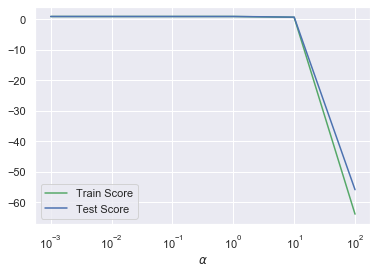

In [85]:
x_range = [0.001,0.01, 0.1, 1, 10, 100]
train_score_list = []
test_score_list = []

for c in x_range: 
    linear_svm = LinearSVR(c)
    linear_svm.fit(X_train_red,y_train)
    train_score_list.append(linear_svm.score(X_train_red,y_train))
    test_score_list.append(linear_svm.score(X_test_red, y_test))
%matplotlib inline
plt.plot(x_range, train_score_list, c = 'g', label = 'Train Score')
plt.plot(x_range, test_score_list, c = 'b', label = 'Test Score')
plt.xscale('log')
plt.legend(loc = 3)
plt.xlabel(r'$\alpha$')

### Kernelized SVR (rbf)

In [86]:
param_grid = {'C': [0.01, 0.1, 1, 10],
              'gamma': [0.01, 0.1, 1, 10],
             }
grid_search = GridSearchCV(SVR(kernel='rbf'), param_grid, cv=5, return_train_score=True)
grid_search.fit(X_train_red, y_train)
grid_search.fit(X_test_red, y_test)
train_score = grid_search.score(X_train_red, y_train)
print(train_score)
test_score = grid_search.score(X_test_red, y_test)
print(test_score)
print("Best parameters: {}".format(grid_search.best_params_))
print("Best cross-validation score: {:.4f}".format(grid_search.best_score_))

0.8338929495966299
0.8722940684536366
Best parameters: {'C': 10, 'gamma': 0.01}
Best cross-validation score: 0.8309


In [87]:
y_pred_KSVM_pca =grid_search.predict(X_test_red)

TR_KSVM_pca = round(grid_search.score(X_train_red, y_train),4)
TS_KSVM_pca= round(grid_search.score(X_test_red, y_test),4)

print('Train score: ',TR_KSVM_pca)
print('Test score: ',TS_KSVM_pca)

RMSE_KSVM_pca= round(np.sqrt(mean_squared_error(y_test,y_pred_KSVM_pca)),4)
print('RMSE: ',RMSE_KSVM_pca)

r2_KSVM_pca= round(r2_score(y_test,y_pred_LSVM_pca),4)
print('R2 score ',r2_KSVM_pca)


Train score:  0.8339
Test score:  0.8723
RMSE:  3.3219
R2 score  0.7741


In [88]:
lmodel_performance.loc['Kernelized SVR (rbf)'] = pd.Series({'Train Score':train_score,'Test Score':test_score, 'Best Parameters': grid_search.best_params_, 'RMSE':RMSE_KSVM_pca, 'Cross Validation Score':grid_search.best_score_ })

In [89]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.964400,0.951400,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.975800,0.957600,-,1.9150,NaN
KSVM Bagging,0.862400,0.813000,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.988200,0.863000,-,3.4401,NaN
DT Ada Boosting,0.991400,0.965000,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN
KSVM Ada Boosting,0.999100,0.538100,"{'learning_rate': 0.1, 'n_estimators': 100}",6.3176,NaN
Gradient Boosting,1.000000,0.961300,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",1.8282,NaN
Linear Regression,0.816900,0.828700,-,3.8476,0.806029
KNN Regression,0.873906,0.868953,{'n_neighbors': 3},3.0612,0.880510
Ridge Regression,0.816900,0.829000,"{'alpha': 10, 'fit_intercept': True, 'normaliz...",3.8444,0.805631


### Kernelized SVR (poly)

In [90]:
param_grid = {'C': [0.01, 0.1, 1],
              'gamma': [0.01, 0.1, 1],
             }

grid_search1 = GridSearchCV(SVR(kernel='poly'), param_grid, cv=5, return_train_score=True)
grid_search1.fit(X_train_red, y_train)
grid_search1.fit(X_test_red, y_test)
train_score= grid_search1.score(X_train_red, y_train)
print(train_score)
test_score= grid_search1.score(X_test_red, y_test)
print(test_score)
print("Best parameters: {}".format(grid_search1.best_params_))
print("Best cross-validation score: {:.4f}".format(grid_search1.best_score_))

y_pred_KSVM_poly =grid_search1.predict(X_test_red)

RMSE_KSVM_poly_pca= round(np.sqrt(mean_squared_error(y_test,y_pred_KSVM_poly)),4)
print('RMSE: ',RMSE_KSVM_poly_pca)


r2_KSVM_poly= round(r2_score(y_test,y_pred_KSVM_poly),4)
print('R2 score ',r2_KSVM_poly)


C:\Users\HP\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


0.2132870650286024
0.3198661017418255
Best parameters: {'C': 0.01, 'gamma': 0.1}
Best cross-validation score: 0.1807
RMSE:  7.6661
R2 score  0.3199


In [91]:
lmodel_performance.loc['Kernelized SVR (poly)'] = pd.Series({'Train Score':train_score,'Test Score':test_score, 'Best Parameters': grid_search1.best_params_, 'RMSE':RMSE_KSVM_poly_pca, 'Cross Validation Score': grid_search1.best_score_})

In [92]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.964400,0.951400,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.975800,0.957600,-,1.9150,NaN
KSVM Bagging,0.862400,0.813000,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.988200,0.863000,-,3.4401,NaN
DT Ada Boosting,0.991400,0.965000,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN
KSVM Ada Boosting,0.999100,0.538100,"{'learning_rate': 0.1, 'n_estimators': 100}",6.3176,NaN
Gradient Boosting,1.000000,0.961300,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",1.8282,NaN
Linear Regression,0.816900,0.828700,-,3.8476,0.806029
KNN Regression,0.873906,0.868953,{'n_neighbors': 3},3.0612,0.880510
Ridge Regression,0.816900,0.829000,"{'alpha': 10, 'fit_intercept': True, 'normaliz...",3.8444,0.805631


### Kernelized SVR (linear)

In [93]:
param_grid = {'C': [0.01, 0.1, 1, 10],
              'gamma': [0.01, 0.1, 1, 10],
             }
grid_search2 = GridSearchCV(SVR(kernel='linear'), param_grid, cv=5, return_train_score=True)
grid_search2.fit(X_train_red, y_train)
grid_search2.fit(X_test_red, y_test)
train_score= grid_search2.score(X_train_red, y_train)
print(train_score)
test_score= grid_search2.score(X_test_red, y_test)
print(test_score)
print("Best parameters: {}".format(grid_search2.best_params_))
print("Best cross-validation score: {:.4f}".format(grid_search2.best_score_))

y_pred_KSVM_lin =grid_search2.predict(X_test_red)

RMSE_KSVM_linear_pca= round(np.sqrt(mean_squared_error(y_test,y_pred_KSVM_lin)),4)
print('RMSE: ',RMSE_KSVM_linear_pca)

r2_KSVM_pca= round(r2_score(y_test,y_pred_KSVM_lin),4)
print('R2 score ',r2_KSVM_pca)

0.8021970385094804
0.8268534761635424
Best parameters: {'C': 0.1, 'gamma': 0.01}
Best cross-validation score: 0.7998
RMSE:  3.868
R2 score  0.8269


In [94]:
lmodel_performance.loc['Kernelized SVR (linear)'] = pd.Series({'Train Score':train_score,'Test Score':test_score, 'Best Parameters': grid_search.best_params_, 'RMSE':RMSE_KSVM_linear_pca, 'Cross Validation Score': grid_search2.best_score_})

In [95]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.964400,0.951400,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.975800,0.957600,-,1.9150,NaN
KSVM Bagging,0.862400,0.813000,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.988200,0.863000,-,3.4401,NaN
DT Ada Boosting,0.991400,0.965000,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN
KSVM Ada Boosting,0.999100,0.538100,"{'learning_rate': 0.1, 'n_estimators': 100}",6.3176,NaN
Gradient Boosting,1.000000,0.961300,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",1.8282,NaN
Linear Regression,0.816900,0.828700,-,3.8476,0.806029
KNN Regression,0.873906,0.868953,{'n_neighbors': 3},3.0612,0.880510
Ridge Regression,0.816900,0.829000,"{'alpha': 10, 'fit_intercept': True, 'normaliz...",3.8444,0.805631


## Deep learning models

In [96]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

In [97]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense
import numpy

numpy.random.seed(10)

model_reg = Sequential()
model_reg.add(Dense(10, input_dim=17,activation='sigmoid'))

# output layer
model_reg.add(Dense(1))
# compile the model

model_reg.compile(loss ='mse',optimizer ='adam', metrics =['mse','mae'])

# train the model
model_reg.fit(X_train,y_train,epochs =30,batch_size=10)
# evaluate model
model_reg.evaluate(X_test,y_test)

Using TensorFlow backend.


Epoch 1/30
1319/1319 [==============================] - 0s 244us/step - loss: 4764.8796 - mse: 4764.8789 - mae: 68.4698
Epoch 2/30
1319/1319 [==============================] - 0s 160us/step - loss: 4625.8171 - mse: 4625.8179 - mae: 67.4778
Epoch 3/30
1319/1319 [==============================] - 0s 152us/step - loss: 4481.1389 - mse: 4481.1392 - mae: 66.4333
Epoch 4/30
1319/1319 [==============================] - 0s 144us/step - loss: 4332.9455 - mse: 4332.9458 - mae: 65.3366
Epoch 5/30
1319/1319 [==============================] - 0s 149us/step - loss: 4183.0720 - mse: 4183.0718 - mae: 64.2029
Epoch 6/30
1319/1319 [==============================] - 0s 162us/step - loss: 4031.7198 - mse: 4031.7202 - mae: 63.0225
Epoch 7/30
1319/1319 [==============================] - 0s 156us/step - loss: 3878.3163 - mse: 3878.3162 - mae: 61.8024
Epoch 8/30
1319/1319 [==============================] - 0s 159us/step - loss: 3722.7569 - mse: 3722.7573 - mae: 60.5345
Epoch 9/30
1319/1319 [==================

[912.184121241714, 912.18408203125, 29.12317657470703]

In [98]:
y_predict_neural = model_reg.predict(X_test)
r2_score(y_test,y_predict_neural)


RMSE_neural= round(np.sqrt(mean_squared_error(y_test,y_predict_neural)),4)
print('RMSE: ',RMSE_neural)

r2_neural= round(r2_score(y_test,y_predict_neural),4)
print('R2 score ',r2_neural)


RMSE:  30.2024
R2 score  -9.5568


In [99]:
lmodel_performance.loc['Neural Network'] = pd.Series({'Train Score':'-','Test Score':'-', 'Best Parameters': '-', 'RMSE': RMSE_neural, 'Cross Validation Score' : '-'})

In [100]:
lmodel_performance

,Train Score,Test Score,Best Parameters,RMSE,Cross Validation Score
Decision Tree Bagging,0.9644,0.9514,"{'max_features': 9, 'max_samples': 1000, 'n_es...",2.0498,NaN
Decision Tree Pasting,0.9758,0.9576,-,1.9150,NaN
KSVM Bagging,0.8624,0.813,"{'max_features': 5, 'max_samples': 200, 'n_est...",4.0196,NaN
KSVM Pasting,0.9882,0.863,-,3.4401,NaN
DT Ada Boosting,0.9914,0.965,"{'learning_rate': 0.5, 'n_estimators': 500}",1.7396,NaN
KSVM Ada Boosting,0.9991,0.5381,"{'learning_rate': 0.1, 'n_estimators': 100}",6.3176,NaN
Gradient Boosting,1,0.9613,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",1.8282,NaN
Linear Regression,0.8169,0.8287,-,3.8476,0.806029
KNN Regression,0.873906,0.868953,{'n_neighbors': 3},3.0612,0.88051
Ridge Regression,0.8169,0.829,"{'alpha': 10, 'fit_intercept': True, 'normaliz...",3.8444,0.805631


In [101]:
Proj1= pd.read_csv("Proj1.csv")
Proj1

,Model,Train Score,Test Score,Average CV Score,Best Parameters
0,Linear Regression,0.827404,0.839145,0.814431,NaN
1,KNN Regression,0.882011,0.883519,0.885036,{'n_neighbors': 2}
2,Ridge Regression,0.825969,0.840982,0.811028,NaN
3,Lasso Regression,0.827369,0.839562,0.821319,{'alpha': 0.01}
4,Polynomial Regression,0.882948,0.822231,-10.819489,NaN
5,Linear SVM,0.782183,0.822603,0.808648,{'C': 10}
6,Kernelized SVR,0.866431,0.941203,0.874469,"{'C': 1000, 'gamma': 0.1}"


Comparing the 2 tables before and after applying PCA (last table is the result of project1 and second last table is the result of project 2), we see that the results haven't improved much and are more or less the same.